<img src="images/sag-pure-grey.png" alt="SAG-Logo" title="SAG-Logo" height="100"/> <img src="images/pyroll_logo.svg" alt="PyRoll-Logo" title="PyRoll-Logo" height="100" />

# Notebook rolling line 32 wire rod Ø8.0 mm | Feeder: Ø10.5 mm
# Variation 4 | finishing blocks only
* SI unit conversion
* excel sheet import of roll data
* import of material data from file
* result interpretation based on pandas dataframe
* report generation in powerpoint

### Flags
* pptx-report
* debug-information
* print function source code

In [1]:
DEBUG = True
FUNC_SOURCE = True

DEBUG = False
FUNC_SOURCE = False

### Import standard modules

In [2]:
from io import StringIO, BytesIO
import datetime 
import warnings

import numpy as np

import pandas as pd
pd.set_option("display.max.columns", None)
pd.set_option("display.max.rows", None)
pd.options.display.float_format = '{:.5f}'.format
from pandas.plotting import table as pdtable

from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning) # performance warning fragmented df
from warnings import filterwarnings
filterwarnings("ignore", category=DeprecationWarning) # deactivate deprecation warning plotly

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from plotly.offline import iplot, init_notebook_mode
from plotly.subplots import make_subplots
init_notebook_mode()
import plotly.graph_objs as go

from IPython.display import HTML

### Import python-pptx

In [3]:
from pptx import Presentation
from pptx.util import Inches, Cm, Pt
from pptx.shapes.shapetree import PicturePlaceholder, TablePlaceholder, ChartPlaceholder
from pptx.enum.chart import XL_CHART_TYPE
from pptx.chart.data import ChartData
from pptx.dml.color import RGBColor

In [4]:
from helpers import pic

#facecolor = 'blanchedalmond'
#labelcolor = 'black'

#facecolor = 'black'
#labelcolor = 'white'

facecolor = '#4b5b69'
labelcolor = '#65a7aa'

mpl.rcParams['figure.facecolor'] = facecolor
mpl.rcParams['axes.labelcolor'] = labelcolor
mpl.rcParams['axes.titlecolor'] = labelcolor
mpl.rcParams['xtick.color'] = labelcolor
mpl.rcParams['ytick.color'] = labelcolor

from cycler import cycler
mpl.rcParams['axes.prop_cycle'] = cycler(color=['#65a7aa', '#beed80'])

mpl.rcParams['figure.figsize'] = [pic['width_max'], pic['height_max']]
mpl.rcParams['legend.loc'] = 'upper right'


mpl.rcParams['figure.max_open_warning'] = 50

In [5]:
mpl.rcParams.keys() if DEBUG else None

### Import PyRolL specific

In [6]:
import pyroll.core as pr
import pyroll.freiberg_flow_stress
from pyroll.freiberg_flow_stress import FreibergFlowStressCoefficients
#import pyroll.wusatowski_spreading
import pyroll.marini_spreading
import pyroll.lendl_equivalent_method
import pyroll.lippmann_mahrenholz_force_torque
import pyroll.zouhar_contact
import pyroll.integral_thermal

from pyroll.from_dict import from_dict as pr_from_dict
from pyroll.export import to_pandas as pr_to_pandas

pr.Config.PREFERRED_PLOTTING_BACKEND = pr.PlottingBackend.PLOTLY
pr.Config.PROFILE_CONTOUR_REFINEMENT = 3600

In [7]:
from helpers import pyroll_possible_imports

versions = {}

for imported in pyroll_possible_imports:
    try:
        exec('version = {}.VERSION'.format(imported))
        versions[imported] = version
    except:
        pass

### Import helpers PyRolL-specific
* unit conversion
* settings for diagrams

In [8]:
# Auxiliary functions for unit control
from UnitConversion import to_convert, convert_SI
from Annotations import annotations

import helpers
from helpers import tab, plot_settings

kind = plot_settings['kind']
rot = plot_settings['rot']
width = plot_settings['width']

In [9]:
ToolDB = {
        'xlsx_file': 'process_data.xlsx',
        'sheet': 'rolls_min',
        }

ProfileData = {
        'xlsx_file': 'process_data.xlsx',
        'sheet': 'profile',
        }

LineDB = {
        'xlsx_file': 'process_data.xlsx',
        'sheet': 'line_x_data',
        }

## User input cell | one sequence (sizing-block)

In [10]:
# Saarstahl AG | Rolling line 32 | Round 8 mm wire rod --> variation 4 | finishing blocks only

line_info = pd.read_excel(LineDB['xlsx_file'], sheet_name=LineDB['sheet']).set_index('StandPos')

# material

mat = 'Steel_54SiCr6'

# in_profile

ProfileID = 'RD20'
in_profile_data, geometry = helpers.GetProfileData(ProfileData, ProfileID)

expansion_factor = 1 # 1.0187 # for cold dimensions billets
geometry = {key: value * expansion_factor * convert_SI['length'] for key, value in geometry.items()}

in_profile_data.update(geometry)

in_profile_data['temperature'] = 880 + convert_SI['temperature']

# rolling schedule

Stands_used_1 = [
                #1,
                #2,
                #3,
                #4,
                #5,
                #6,
                #7,
                #8,
                #9,
                #10,
                #11,
                #12,
                #13,
                #14,
                #15,
                #16,
                #17,
                #18,
                #19,
                #20,
                21,
                22,
                23,
                24,
                25,
                26,
                27,
                28,
                #29,
                #30,
                31,
                32,
                33,
                34,
                ]

Sequence_1 = [
            #'OV13_02',
            #'RD32',
            #'OV1504',
            #'RD1604',
            #'OV1700',
            #'RD1800',
            'OV1909',
            'RD2009',
            'OV2109',
            'RD2006',
            'OV2106',
            'RD2206',
            'OV2306',
            'RD2406',
            'F7_3',
            'R9_2',
            'S11_1',
            'P8',
            ]

gear_levels_1 = np.array([[
                        #1,
                        #1,
                        #1,
                        #1,
                        #1,
                        #1,
                        1,
                        1,
                        1,
                        1,
                        1,
                        1,
                        1,
                        1,
                        3,
                        3,
                        3,
                        3,
                        ]]).T

gear_ratios_1 = line_info.query('StandPos in @Stands_used_1')[['gear level 1', 'gear level 2', 'gear level 3']].to_numpy()
transport_lengths_1 = line_info.query('StandPos in @Stands_used_1')['transport length'].to_numpy()
durations_1 = line_info.query('StandPos in @Stands_used_1')['duration'].to_numpy()
Stand_orientations_1 = line_info.query('StandPos in @Stands_used_1')['orientation'].to_list()

# roll properties

ROLL_SURFACE_TEMPERATURE = 25 + convert_SI['temperature']

#COULOMB_FRICTION = 0.4 * np.ones_like(Sequence, dtype='int32')
#COULOMB_FRICTION[:4] = 0.8
COULOMB_FRICTION_1 = line_info.query('StandPos in @Stands_used_1')['coulomb friction'].to_numpy()

gaps_1 = np.array([
                #6.8,
                #4.0,
                #1.0,
                #1.5,
                #2.0,
                #2.0,
                2.8,
                1.4,
                2.1,
                2.0,
                2.2,
                1.4,
                1.7,
                1.5,
                1.1,
                1.0,
                1.1,
                1.05
               ])

dimension_ctrl_1 = np.hstack([gaps_1]) * convert_SI['length']

RPM_actual_1 = np.array([
                      #288,
                      #359,
                      #575,
                      #690,
                      #863,
                      #1054,
                      1613,
                      1890,
                      2244,
                      2628,
                      3126,
                      4863,
                      5773,
                      6763,
                      5425,
                      6407,
                      10525,
                      11489
                      ])

velocity_actual_1 = np.array([
                            #5.41,
                            #6.54,
                            #8.15,
                            #9.50,
                            #12.8,
                            #14.7,
                            16.3,
                            19.4,
                            23.4,
                            27.2,
                            33.0,
                            38.4,
                            46.4,
                            53.7,
                            65.3,
                            75.8,
                            83.1,
                            90.0,
                            ])

# solve strategy

solve_strategies_1 = [ None,
                    {'solve_type': 'given_RPM', 'v_target': None, 'RPM': RPM_actual_1 * convert_SI['frequency']},
                    {'solve_type': 'given_vel', 'v_target': velocity_actual_1},
                    {'solve_type': 'forward', 'v_target': 65.3},
                    {'solve_type': 'backward', 'v_target': 90.0},
                   ]

#solve_strategy_1 = solve_strategies[1]
#solve_strategy_1 = solve_strategies[2]
#solve_strategy_1 = solve_strategies[3]
solve_strategy_1 = solve_strategies_1[4]

### Name of the PowerPoint file

In [11]:
pptx_report = 'RD8.0{}_feeder10.5_v4_fb.pptx'.format(solve_strategy_1['solve_type'])

### Collect roll data from excel sheet

![Excel](excel_tools.png)

In [12]:
RollDB = helpers.CreateRollDB(ToolDB, convert_SI)

RollDB if DEBUG else None

In [13]:
if FUNC_SOURCE:
    ??helpers.CreateRollDB

### Complete stand definitions

In [14]:
PassSequence_1 = helpers.SetupStandDefinition(Sequence_1, RollDB, COULOMB_FRICTION_1, dimension_ctrl_1, solve_strategy_1)

try:
    for n, Stand in enumerate(PassSequence_1):
        Stand.orientation = Stand_orientations_1[n]
except:
    pass

PassSequence_1 if DEBUG else None

In [15]:
if FUNC_SOURCE:
    ??helpers.SetupStandDefinition

### Read material data (dictionary) from python-file

In [16]:
exec('from Materials import {} as material'.format(mat))

### Create in_profile

In [17]:
Rod = helpers.CreateProfile({**in_profile_data, **material})

Rod if DEBUG else None

In [18]:
Rod

""
classifiers
'round'
cross_section


In [19]:
if FUNC_SOURCE:
    ??helpers.CreateProfile

### Add transports to PassSequence

In [20]:
PassSequence = helpers.AddTransports(PassSequence_1, transport_lengths_1)

PassSequence if DEBUG else None

In [21]:
if FUNC_SOURCE:
    ??helpers.AddTransports

### Calculate the pass sequence

In [22]:
sequence_1 = pr.PassSequence(PassSequence)

sequence_1 if DEBUG else None

### Determine actual rolling speed

In [23]:
helpers.SolveSequence(sequence_1, Rod, solve_strategy_1)

Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.


backward


Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulging.
Infinitesimal small spreading. Continuing without bulgin

In [24]:
if FUNC_SOURCE:
    ??helpers.SolveSequence

### Transfer PyRolL-results to pandas dataframe

In [25]:
df = pr_to_pandas(sequence_1)

df if DEBUG else None

In [26]:
df_Transports = (df
                .query("type == 'Transport'")
                .dropna(axis=1, how='all')
                .reset_index(drop=True)
               )

df_Transports if DEBUG else None

In [27]:
df = (df
        .query("type != 'Transport'")
        .reset_index(drop=True)
     )

df if DEBUG else None

### Adjust result dataframe to user requirements

In [28]:
df = helpers.Modify_df(df)

In [29]:
if FUNC_SOURCE:
    ??helpers.Modify_df

In [30]:
df['StandPos_line'] = Stands_used_1
df['roll_working_diameter'] = 2 * df['roll_working_radius']
df['number_of_rolls'] = df.apply(lambda row: 3 if row.roll_type.startswith('Three') else 2, axis=1)
df['roll_roll_torque'] *= df['number_of_rolls']
df['roll_roll_torque'] /= 1000
df['roll_force'] /= 1000
df['power'] /= 1000
df['gear_levels'] = gear_levels_1
df['gear_ratios'] = np.take_along_axis(gear_ratios_1, gear_levels_1-1, axis=1).flatten()
df['motor_rpms'] = df['roll_rotational_frequency'] * df['gear_ratios']
df['roll_rot_freq_shop'] = RPM_actual_1
df['roll_working_velocity_shop'] = df['roll_working_diameter'] * convert_SI['length'] * np.pi * df['roll_rot_freq_shop'] * convert_SI['frequency']
df['hred'] = df['in_profile_cross_section_height'] - df['out_profile_cross_section_height']
df['mass_flux_calc'] = df.eval('out_profile_density * out_profile_cross_section_area * velocity') * convert_SI['area']
df['mass_flux'] = np.array([rpass.mass_flux for rpass in sequence_1.roll_passes])
df = df.rename(columns={'inscribed_circle_diameter': 'DSA'})
df['out_profile_width'] = df.apply(lambda row: row.out_profile_contact_lines_length/3 if row.roll_type.startswith('Three') else row.out_profile_width, axis=1)
df['reduction'] = df.eval('(1. - out_profile_cross_section_area / in_profile_cross_section_area) * 100')
df['area_ratio'] = df.eval('in_profile_cross_section_area / out_profile_cross_section_area')
df['time'] = df.eval('in_profile_t + (out_profile_t - in_profile_t) / 2')

df['out_profile_cross_section_polar'] = (
                                        (df['out_profile_cross_section_x'] + df['out_profile_cross_section_y'] * 1.0j)
                                        .apply(lambda z: np.array([np.abs(z), np.angle(z)]))
                                        .apply(lambda arr: arr[:, np.argsort(arr[1])])
                                        )

df['technologically_orientated_contour_lines_polar'] = (
                                                        (df['technologically_orientated_contour_lines_x'] + df['technologically_orientated_contour_lines_y'] * 1.0j)
                                                        .apply(lambda z: np.array([np.abs(z), np.angle(z)]))
                                                        .apply(lambda arr: arr[:, np.argsort(arr[1])])
                                                        )

df['GT'] = df[['out_profile_cross_section_height']].min(axis=1)
df['DT'] = df[['out_profile_cross_section_width']].max(axis=1)
df['dim_ctrl'] = df.apply(lambda row: row.DSA if row.roll_type.startswith('Three') else row.gap, axis=1)
df['dim_ctrl_type'] = df.apply(lambda row: 'DSA' if row.roll_type.startswith('Three') else 'gap', axis=1)

In [31]:
df.head() if DEBUG else None

#### Determine reasonable plot limits

In [32]:
limit = 1.05 * np.ceil(df.roll_groove_contour_line_x[0].max() / 10) * 10
rmax = limit

### Example 3D plot of profiles

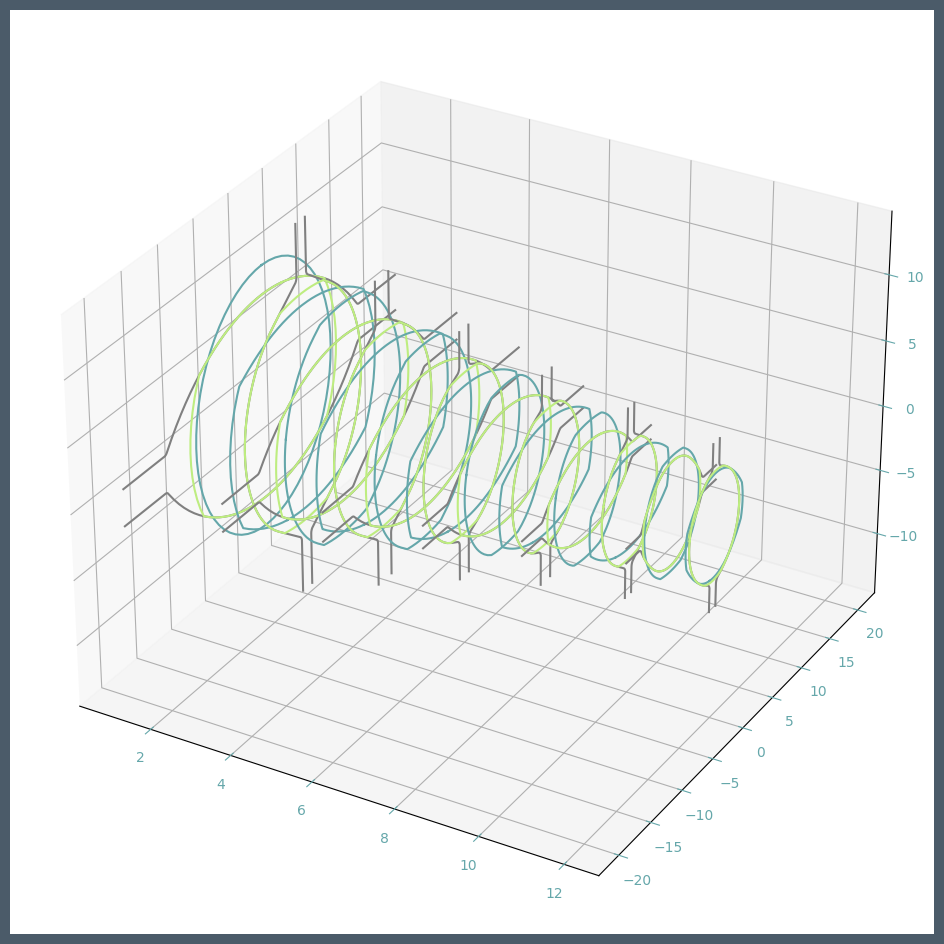

In [33]:
fig = plt.figure(figsize=(40, 12))

ax = fig.add_subplot(projection='3d')

for Splot in df['StandPos'].unique():
    
    dfplot = df.query("StandPos==@Splot")
    dfplot.reset_index(drop=True, inplace=True)
    
    xr = Splot * np.ones_like(dfplot['technologically_orientated_contour_lines_x'][0])
    yr = dfplot['technologically_orientated_contour_lines_x'][0]
    zr = dfplot['technologically_orientated_contour_lines_y'][0]

    xi = Splot * np.ones_like(dfplot['in_profile_cross_section_x'][0])
    yi = dfplot['in_profile_cross_section_x'][0]
    zi = dfplot['in_profile_cross_section_y'][0]
    
    xo = Splot * np.ones_like(dfplot['out_profile_cross_section_x'][0])
    yo = dfplot['out_profile_cross_section_x'][0]
    zo = dfplot['out_profile_cross_section_y'][0]

    ax.plot3D(xr,yr,zr, c=plot_settings['tool_color'])
    ax.plot3D(xi,yi,zi)
    ax.plot3D(xo,yo,zo)

### Example dynamic comparision plot in_profile / out_profile

In [34]:
HTML(helpers.AnimateSequence(df, limit, plot_settings, size=6).to_jshtml())

In [35]:
if FUNC_SOURCE:
    ??helpers.AnimateSequence

### Initialize pptx-report

In [36]:
prs = Presentation('pptx_template_16to9.pptx')
#    prs = Presentation('../pptx/pptx_template_16to9.pptx')

layouts = {
            'Title_Slide' : prs.slide_layouts[0],
            'Text_Slide' : prs.slide_layouts[1],
            'Title_Only': prs.slide_layouts[5],
            'Empty' : prs.slide_layouts[6]
            }

In [37]:
slide = prs.slides.add_slide(layouts['Title_Slide'])

slide.shapes.title.text = 'Entwicklung\nPyRolL-Template'

slide.placeholders[1].text = '{}'.format(datetime.datetime.now().strftime('%A %d %B %Y  %X'))

# slide change
    
slide = prs.slides.add_slide(layouts['Text_Slide'])

slide.shapes.title.text = 'PyRolL imports'

text_frame = slide.placeholders[1].text_frame

version_strs = ['{}   {}'.format(key, item) for key, item in versions.items()]

text_frame.paragraphs[0].text = version_strs[0]

for version_str in version_strs[1:]:
    text_frame.add_paragraph().text = version_str

## plot-Examples

### Example plot table

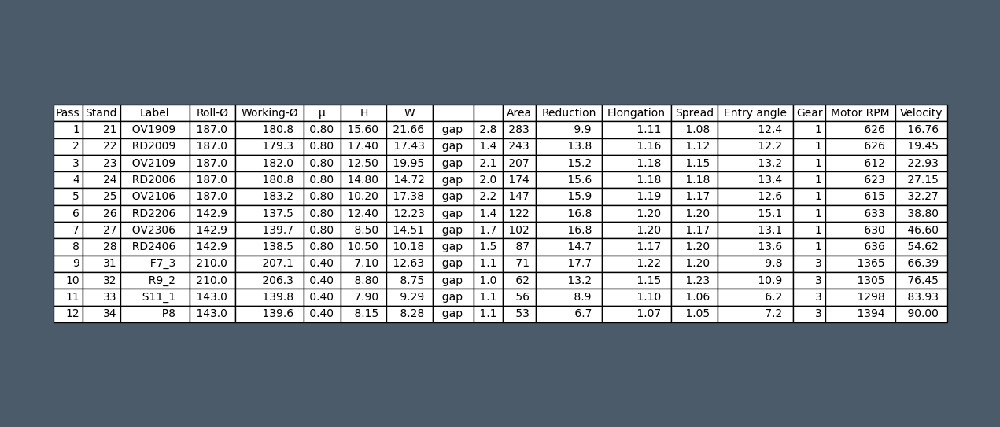

In [38]:
helpers.TablePlot(df, prs, layouts, 'Title_Only', 'Example plot table')

In [39]:
if FUNC_SOURCE:
    ??helpers.TablePlot

### Example plot time-history

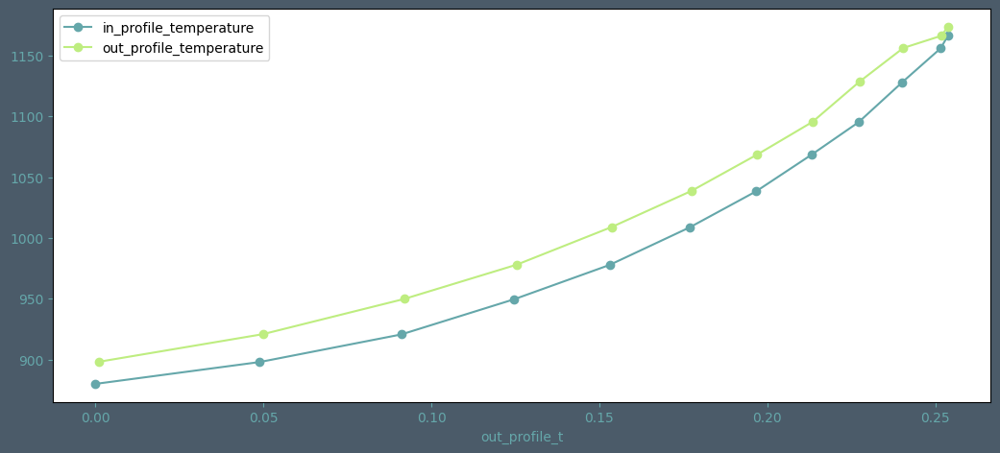

In [40]:
fig, ax = plt.subplots( )

df.plot(x='in_profile_t', y='in_profile_temperature', ax=ax, marker='o')
df.plot(x='out_profile_t', y='out_profile_temperature', ax=ax, marker='o')

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot time-history')

### Temperatures plot

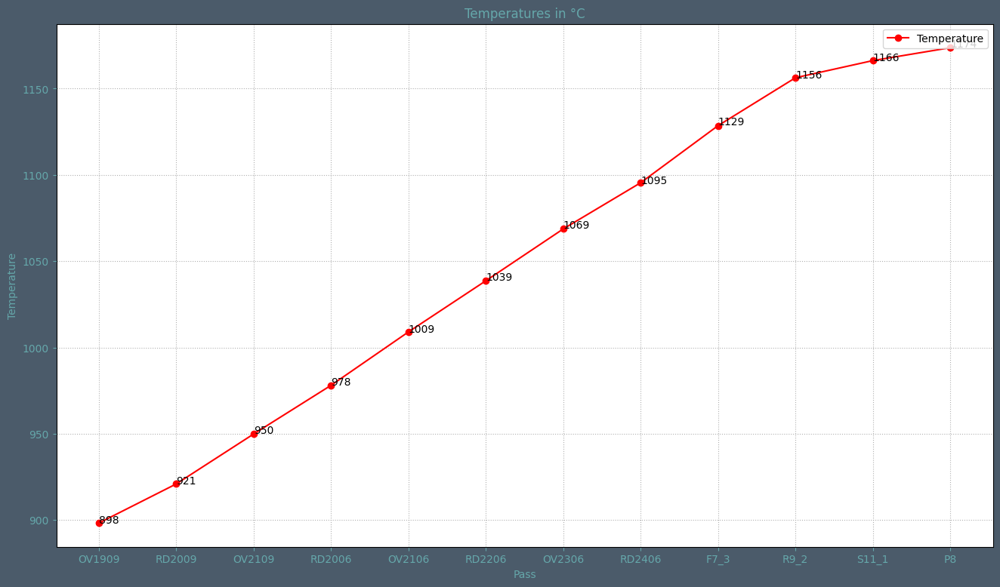

In [41]:
# Temperatures
fig, ax = plt.subplots(figsize=(16, 9), facecolor='#4b5b6a')

#ax.plot(df['label'], df['out_profile_core_temperature'], color='orange', linestyle='-', marker='o', label='Core Temperature')
ax.plot(df['label'], df['out_profile_temperature'], color='red', linestyle='-', marker='o', label='Temperature')
#ax.plot(df['label'], df['out_profile_surface_temperature'], color='grey', linestyle='-', marker='o', label='Surface Temperature')

for i in range(len(df)):
    #ax.text(df['label'][i], round(df['out_profile_core_temperature'][i]), round(df['out_profile_core_temperature'][i]), ha='right')
    ax.text(df['label'][i], round(df['out_profile_temperature'][i]), round(df['out_profile_temperature'][i]), ha='left')
    #ax.text(df['label'][i], round(df['out_profile_surface_temperature'][i]), round(df['out_profile_surface_temperature'][i]), ha='left')

ax.set_title('Temperatures in °C')
ax.set_xlabel('Pass')
ax.set_ylabel('Temperature')
ax.grid(True, linestyle=':')
ax.legend()

### Example working_velocity and rotational_frequency

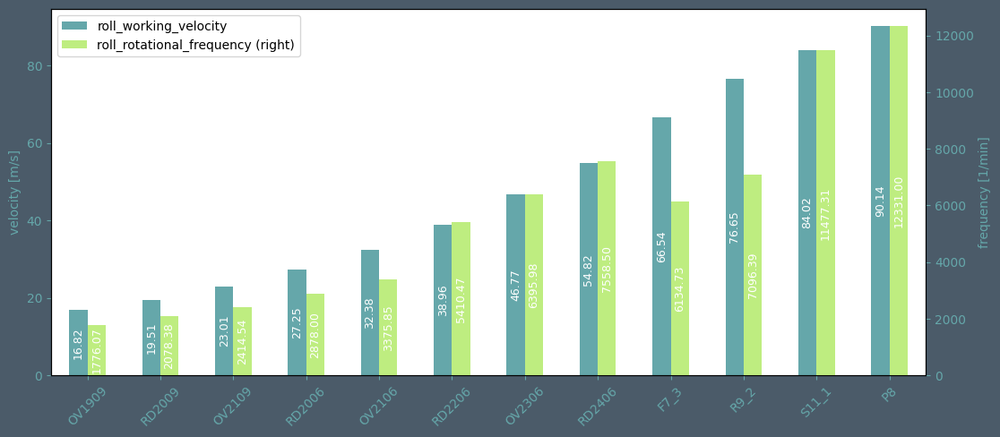

In [42]:
fig, ax = plt.subplots()

dfplot=df.query("Source == 'PyRolL'").set_index('label')[['roll_working_velocity','roll_rotational_frequency']]
dfplot.plot(secondary_y='roll_rotational_frequency', ax=ax, kind='bar', rot=45)

ax.set_xlabel('')
ax.set_ylabel('velocity [m/s]')
ax.right_ax.set_ylabel('frequency [1/min]')

prop = 'roll_rotational_frequency'
for container in ax.containers:
    ax.bar_label(container,
                 fmt=annotations[prop]['fmt'],
                 label_type=annotations[prop]['label'],
                 color=annotations[prop]['font_color'],
                 fontsize=9,
                 rotation=90)

for container in ax.right_ax.containers:
    ax.right_ax.bar_label(container,
                 fmt=annotations[prop]['fmt'],
                 label_type=annotations[prop]['label'],
                 color=annotations[prop]['font_color'],
                 fontsize=9,
                 rotation=90,
                )

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'working_velocity and rotational_frequency')

### Example plot basic information plasticity

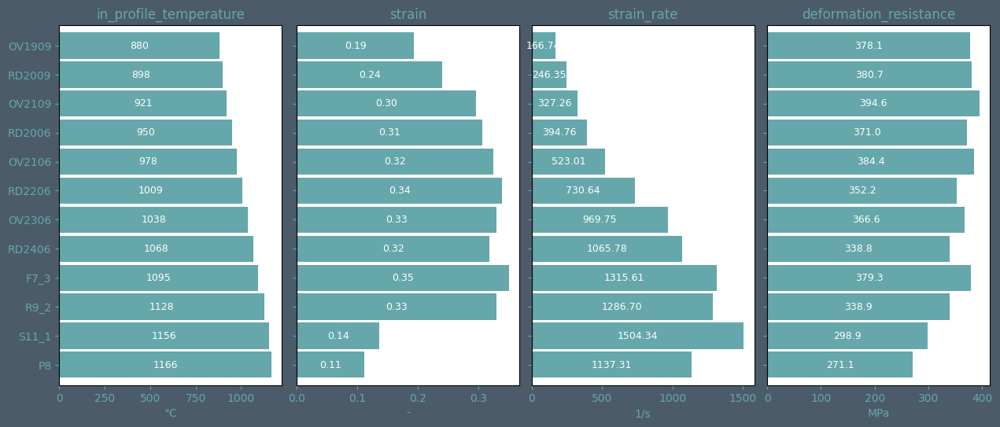

In [43]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'in_profile_temperature', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'strain', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'strain_rate', kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'deformation_resistance', kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot basic information plasticity')

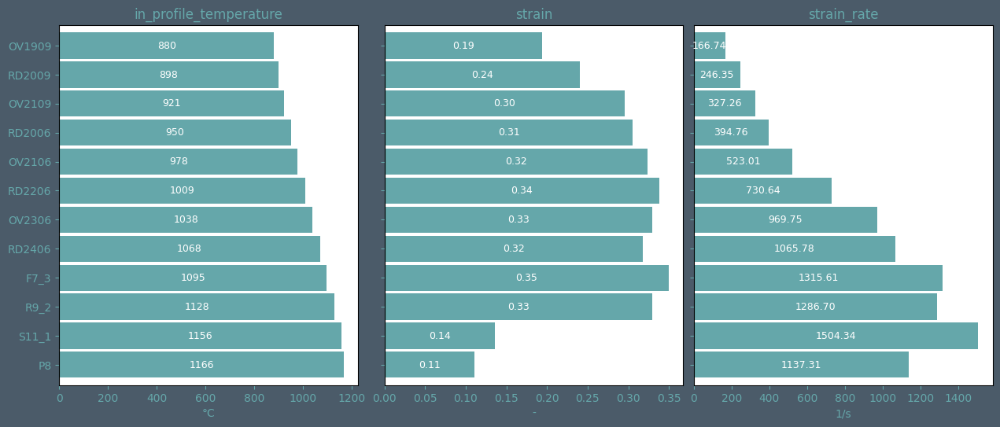

In [44]:
fig, (ax1, ax2, ax3) = plt.subplots(
                                    nrows=1, ncols=3,
                                    sharey=True,
                                    layout="constrained"
                                    )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'in_profile_temperature', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'strain', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'strain_rate', kind, ax3, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot basic information plasticity')

### Example plot information process

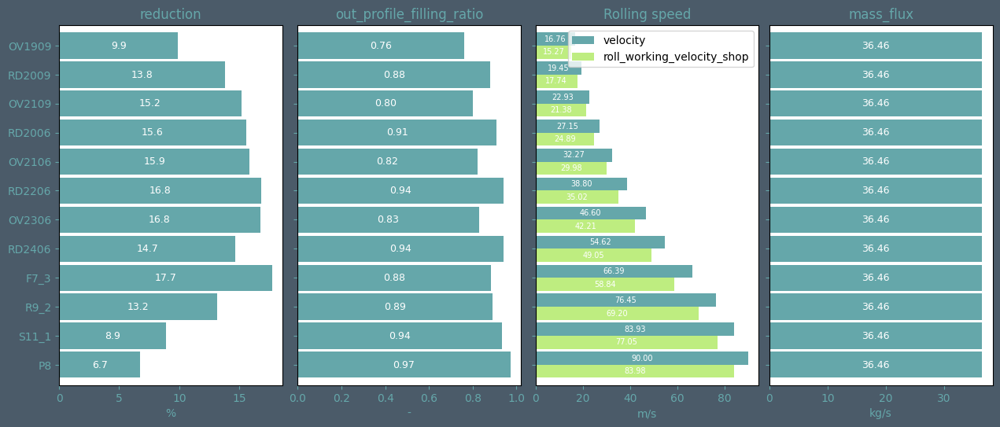

In [45]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'reduction', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'out_profile_filling_ratio', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['velocity', 'roll_working_velocity_shop'], kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'mass_flux', kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

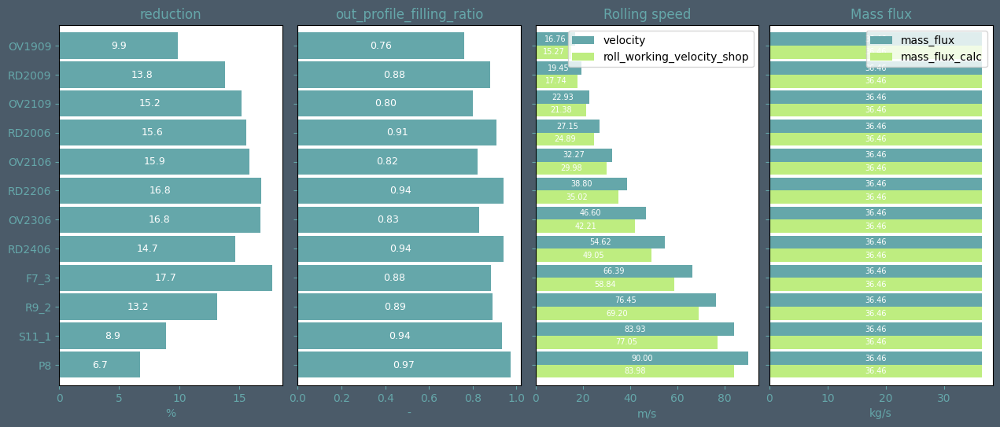

In [46]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'reduction', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'out_profile_filling_ratio', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['velocity', 'roll_working_velocity_shop'], kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['mass_flux', 'mass_flux_calc'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

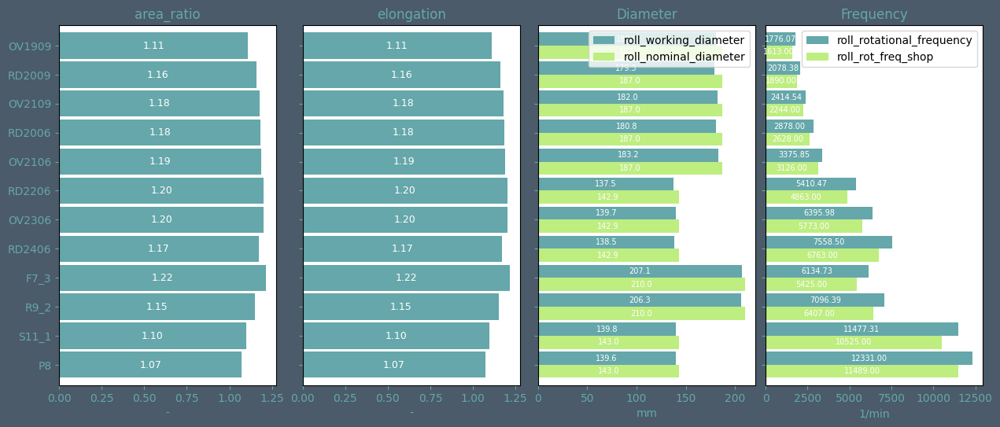

In [47]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'area_ratio', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'elongation', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['roll_working_diameter', 'roll_nominal_diameter'], kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['roll_rotational_frequency', 'roll_rot_freq_shop'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

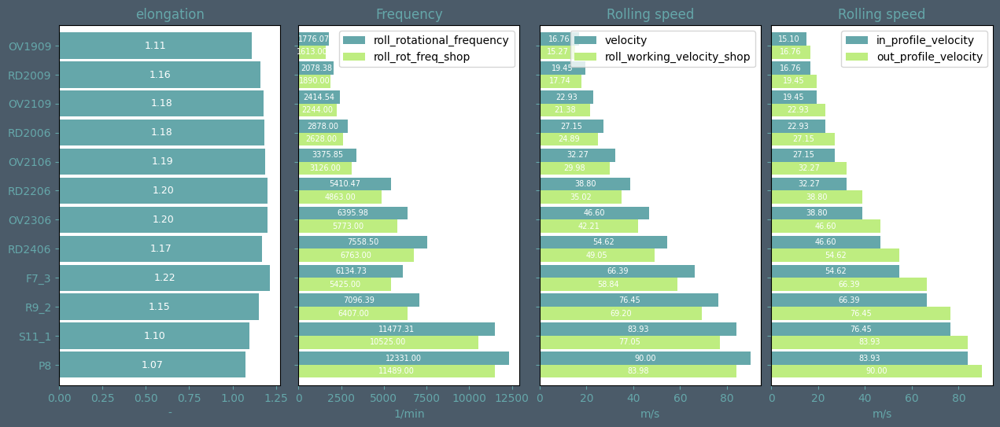

In [48]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'elongation', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['roll_rotational_frequency', 'roll_rot_freq_shop'], kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['velocity', 'roll_working_velocity_shop'], kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['in_profile_velocity', 'out_profile_velocity'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

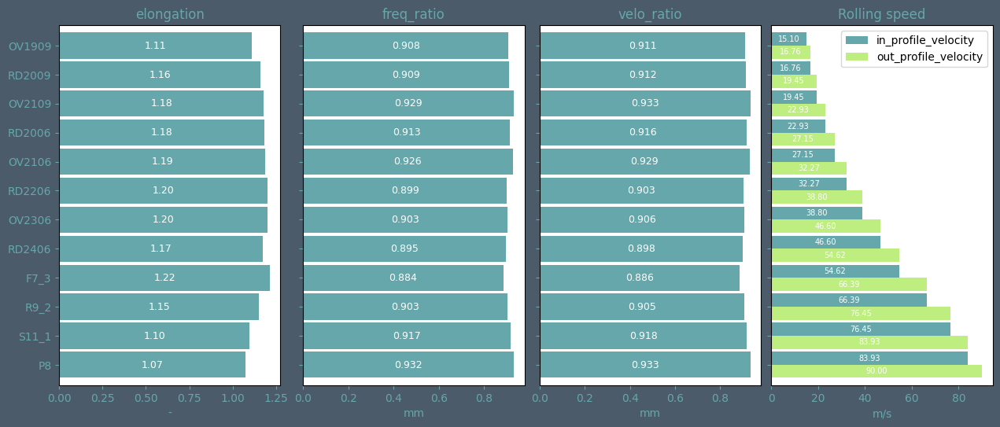

In [49]:
df['freq_ratio'] =  df['roll_rot_freq_shop'] / df['roll_rotational_frequency']
df['velo_ratio'] =  df['roll_working_velocity_shop'] / df['velocity']

fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'elongation', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'freq_ratio', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'velo_ratio', kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['in_profile_velocity', 'out_profile_velocity'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

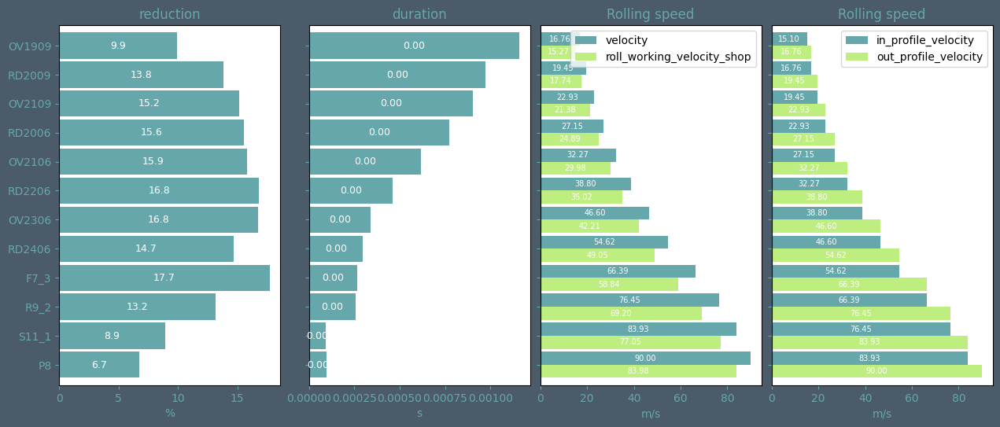

In [50]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'reduction', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'duration', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['velocity', 'roll_working_velocity_shop'], kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['in_profile_velocity', 'out_profile_velocity'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

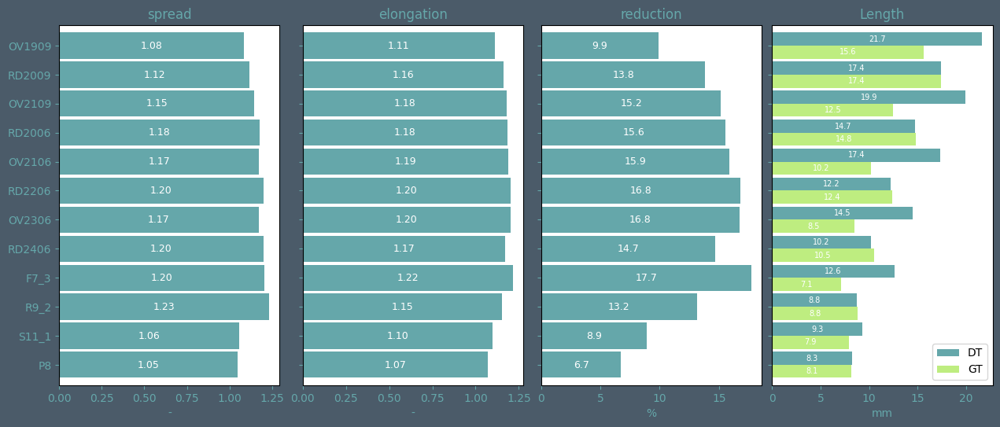

In [51]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(
                                            nrows=1, ncols=4,
                                            sharey=True,
                                            layout="constrained"
                                            )

helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'spread', kind, ax1, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'elongation', kind, ax2, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', 'reduction', kind, ax3, rot, width, annotations)
helpers.axplot(df.query("Source =='PyRolL'"), 'label', ['DT', 'GT'], kind, ax4, rot, width, annotations)

helpers.AddPictureToSlide(prs, layouts, 'Title_Only', pic, fig, 'Example plot information process')

### Example sequence plot profile comparison

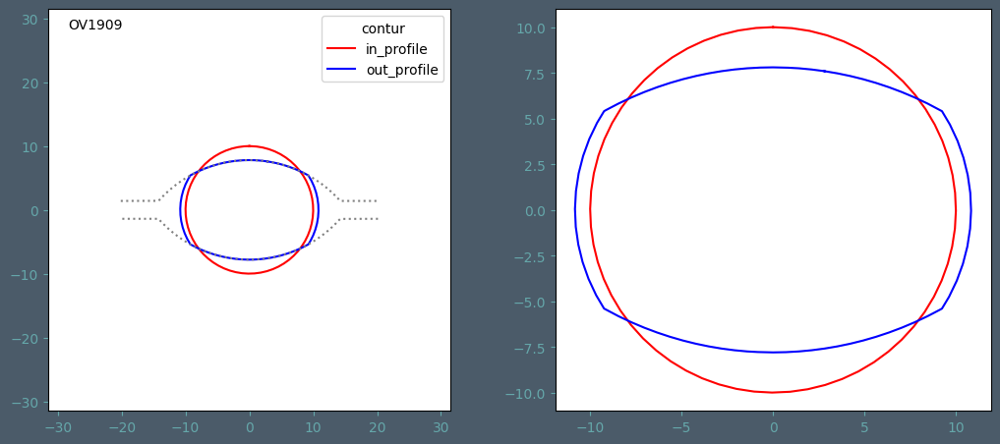

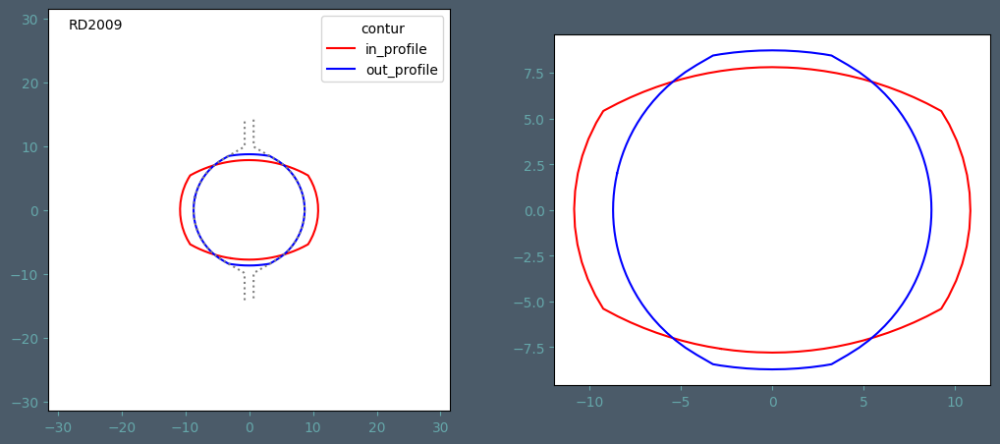

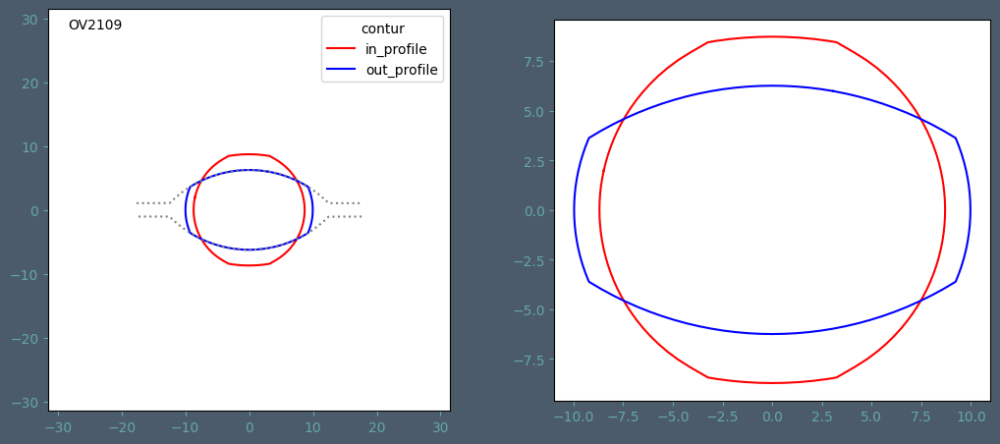

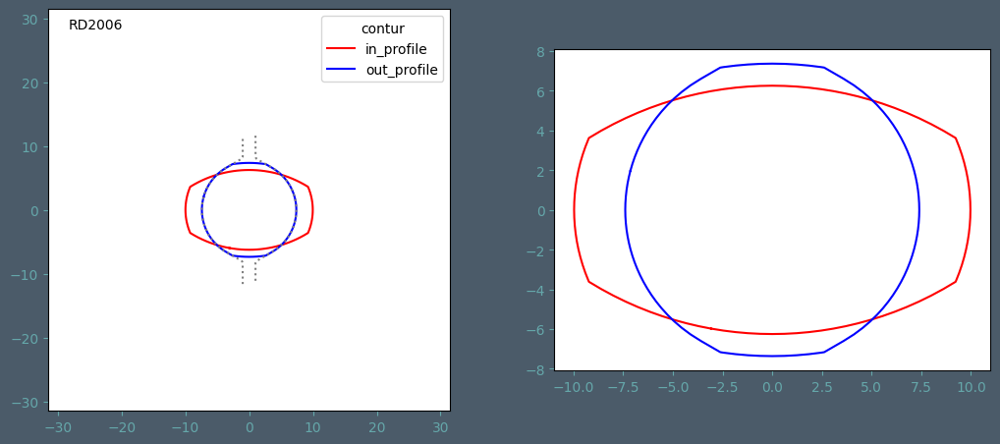

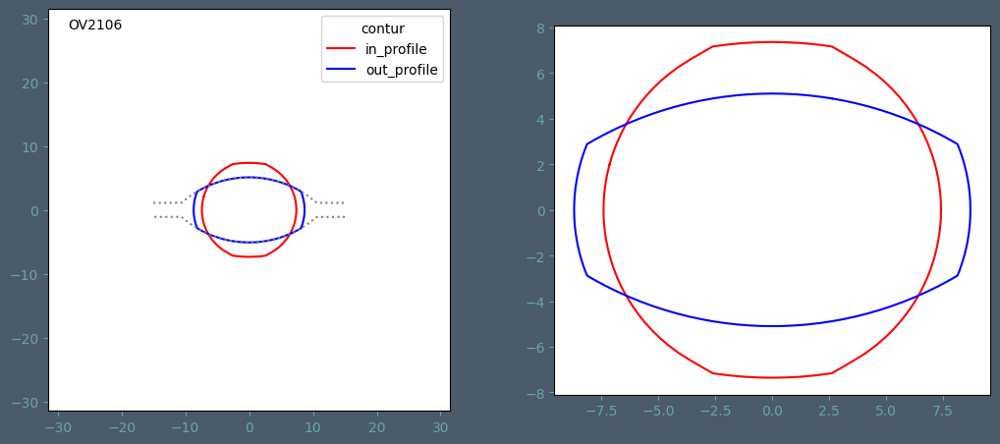

...

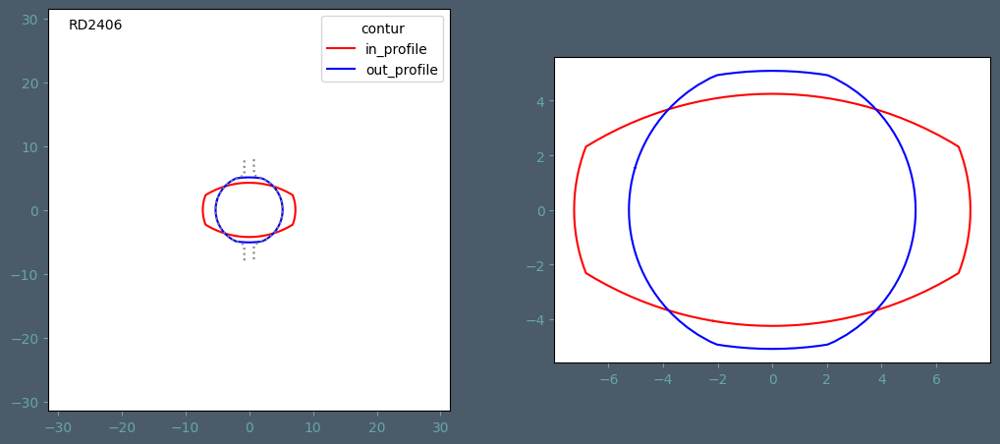

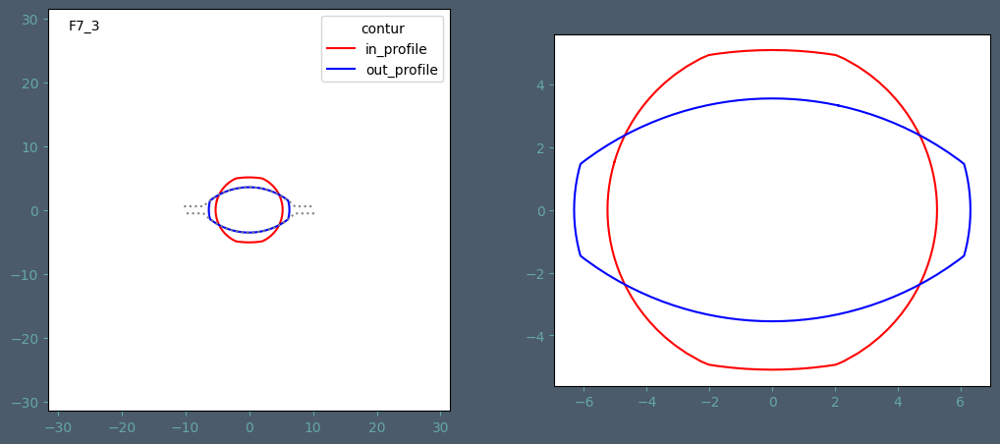

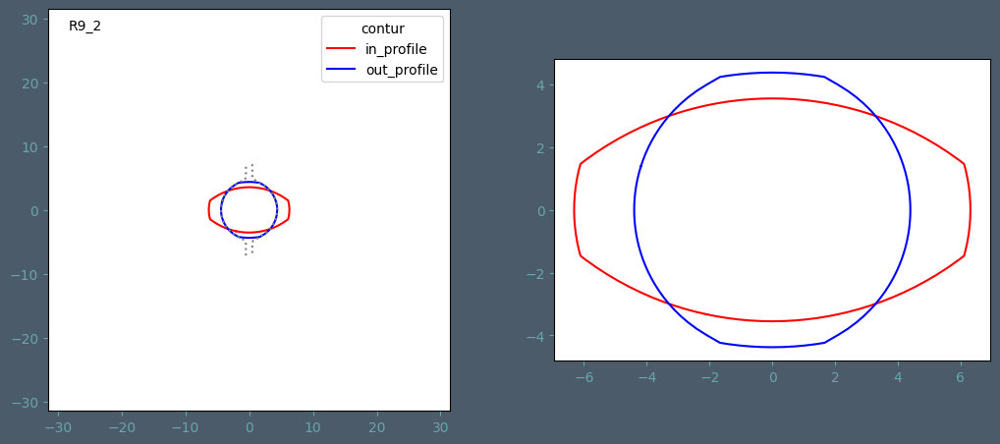

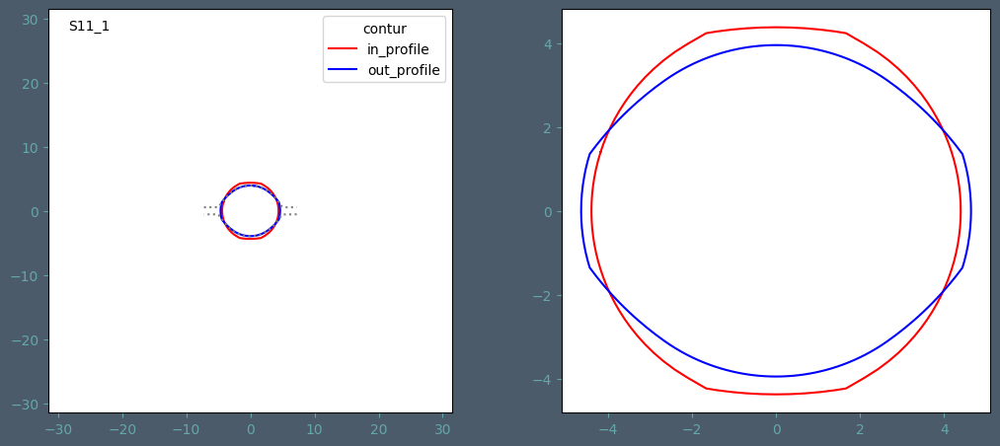

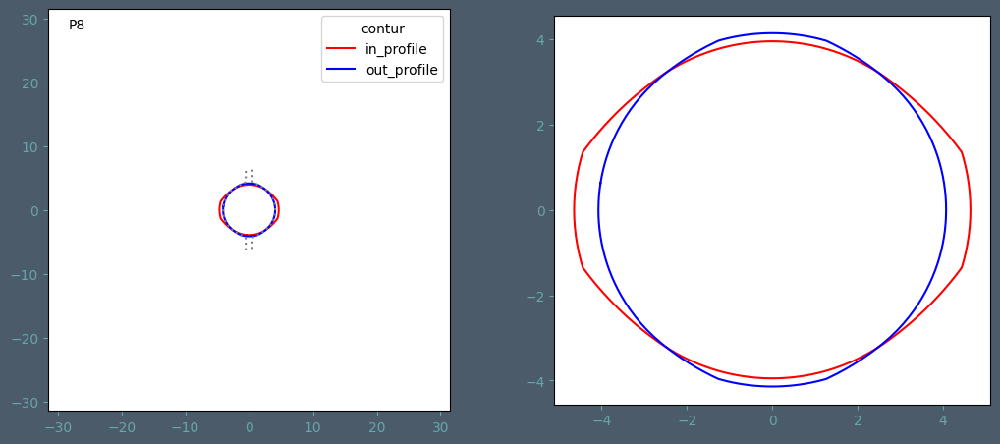

In [52]:
helpers.ComparisonPlot(df,['in_profile_cross_section', 'out_profile_cross_section', 'contur'],
                         limit,
                         prs, layouts, 'Title_Only', 'profile')

### Example sequence plot profile comparison cross_sections filled

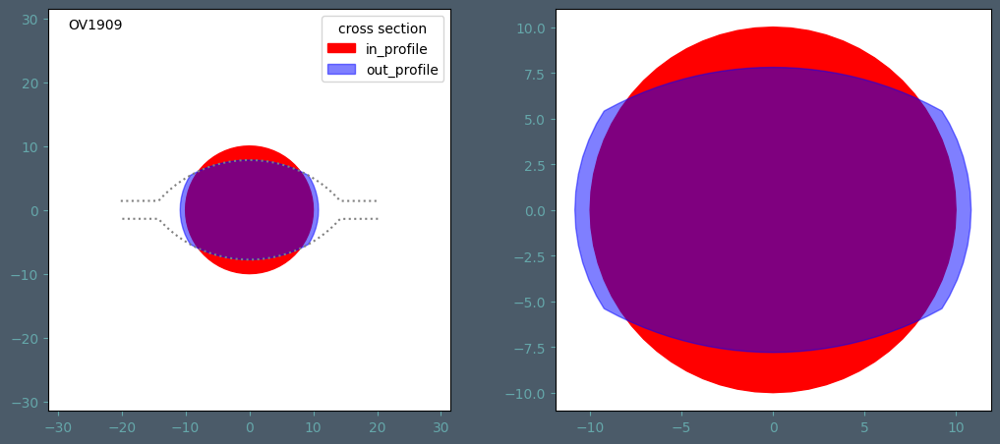

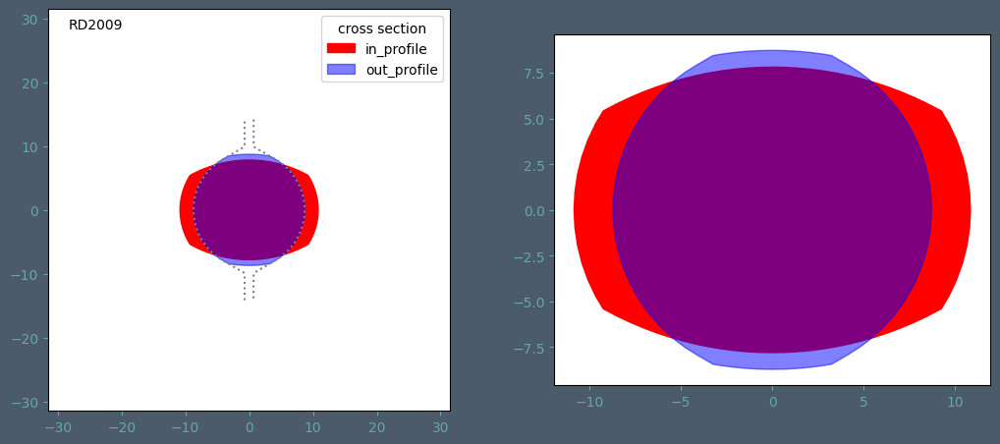

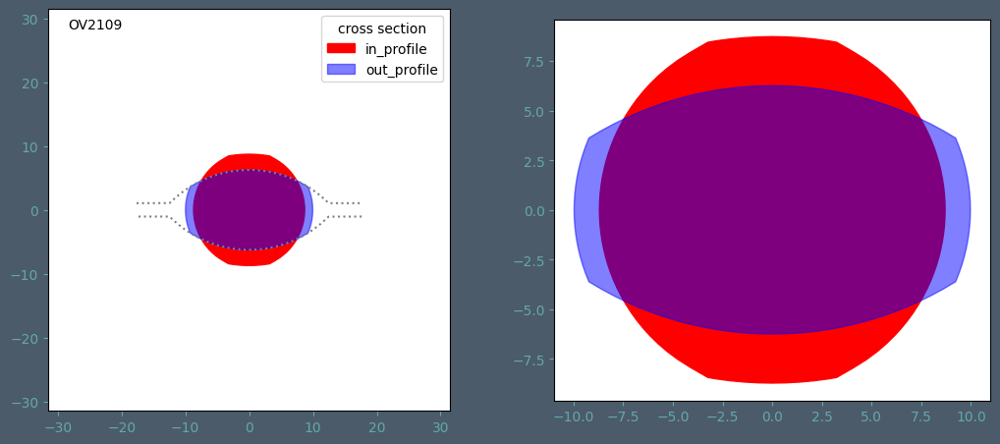

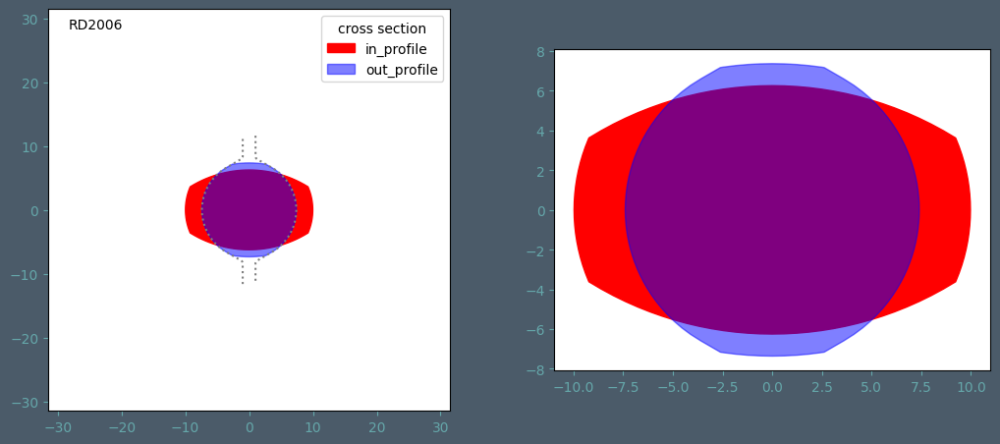

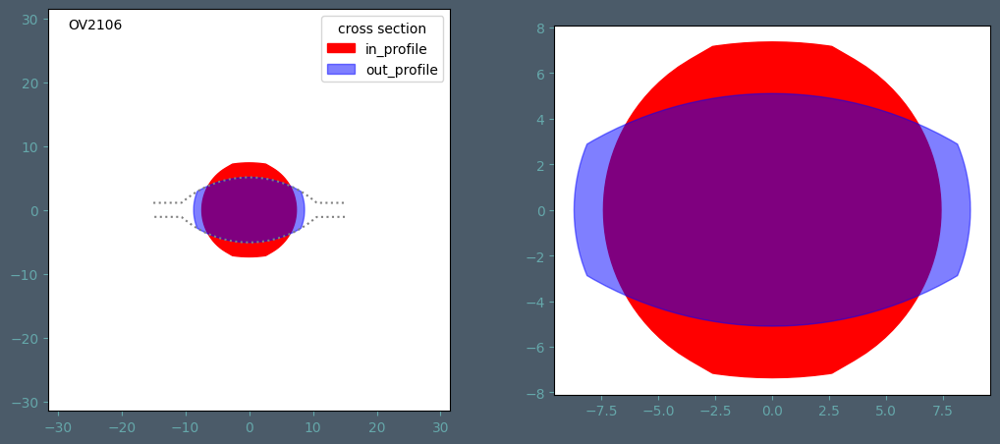

...

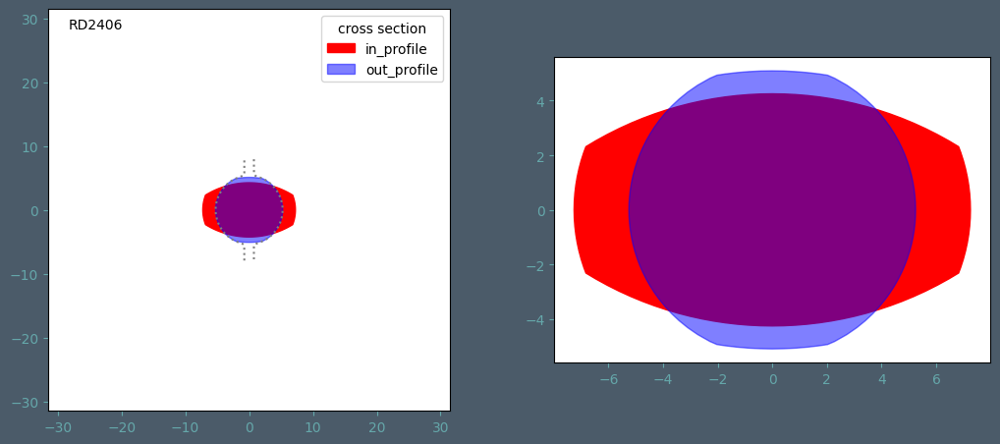

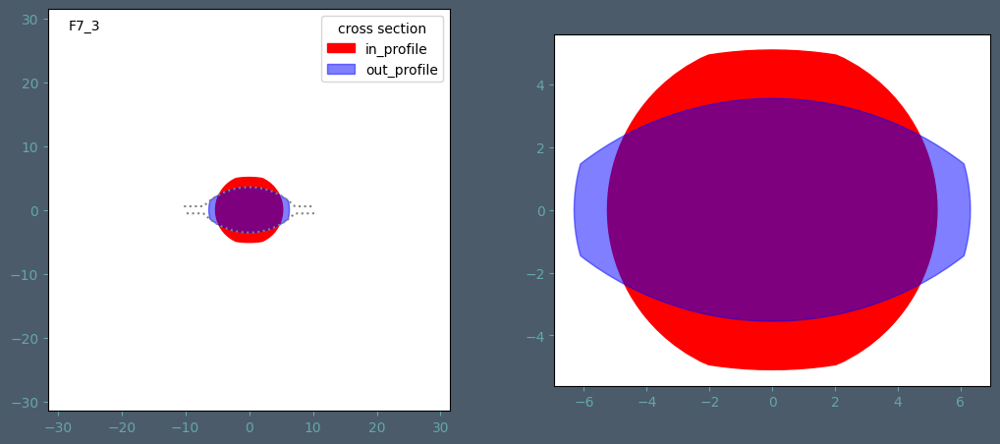

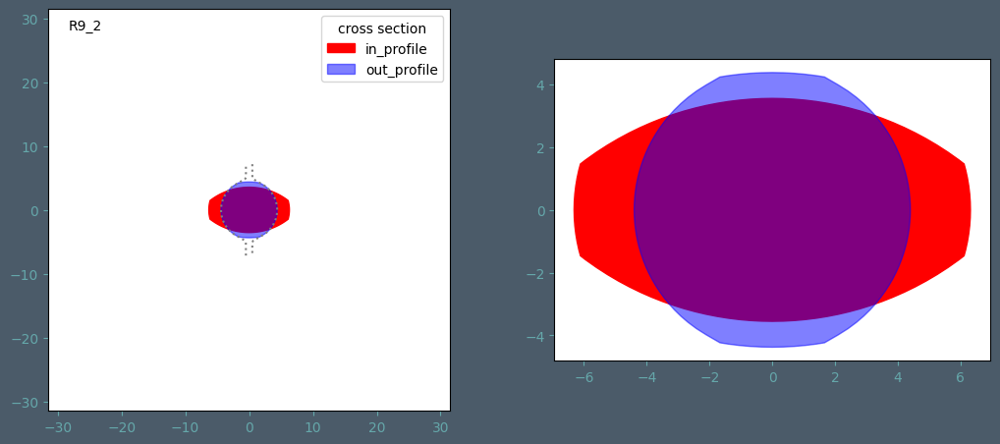

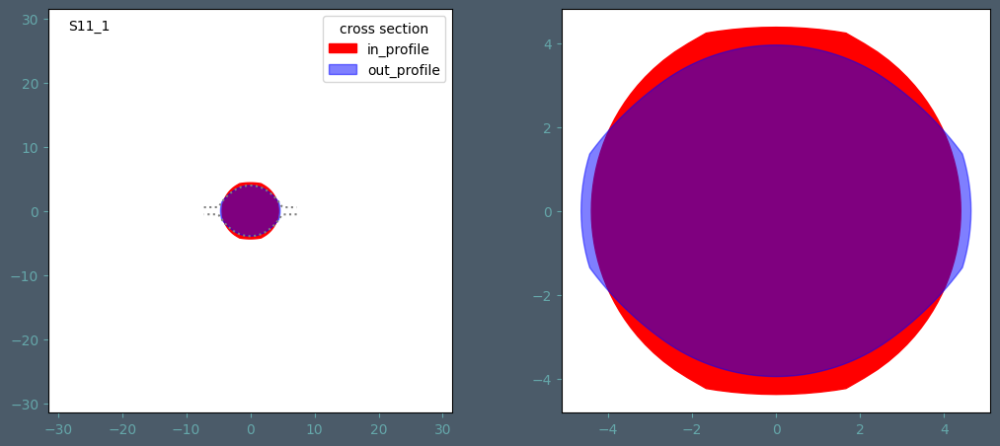

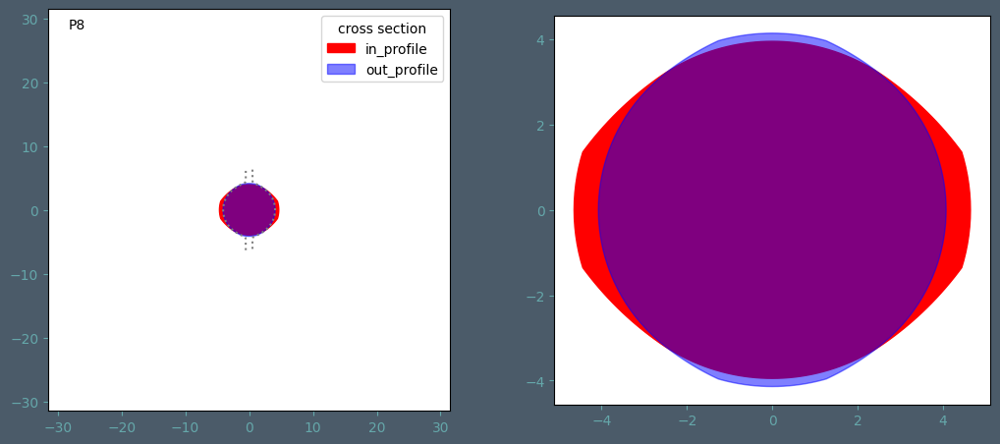

In [53]:
helpers.ComparisonPlot(df, ['in_profile_cross_section', 'out_profile_cross_section', 'cross section'],
                         limit,
                         prs, layouts, 'Title_Only', 'cross_sections filled', True)

### Example sequence plot profile comparison with equivalent rectangle

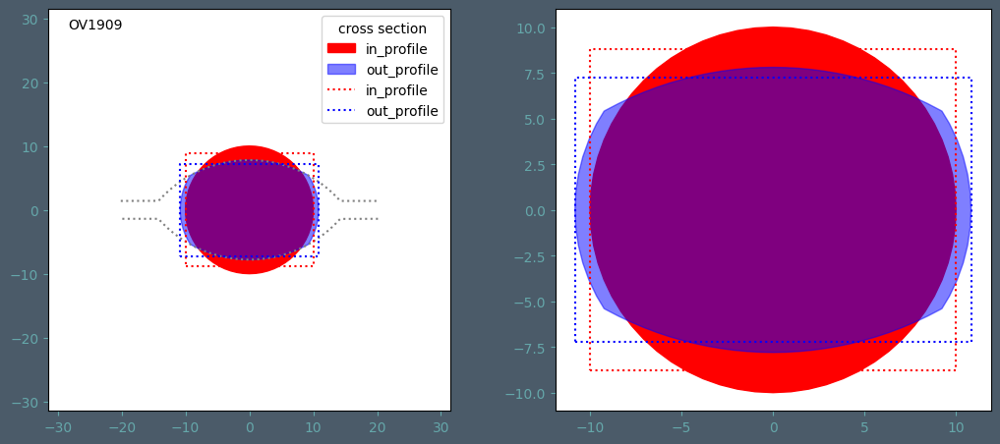

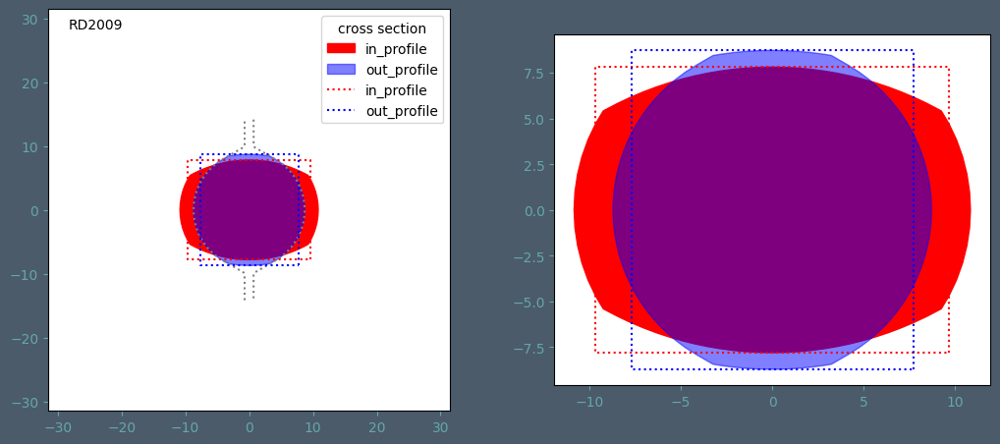

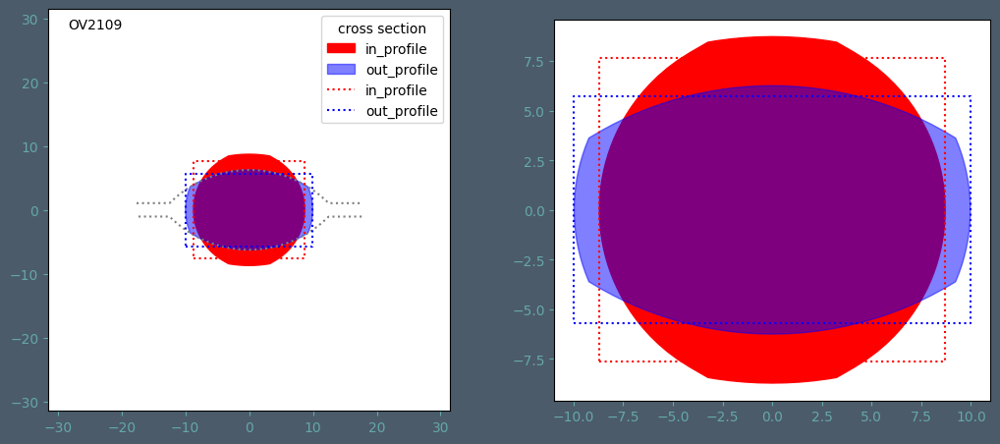

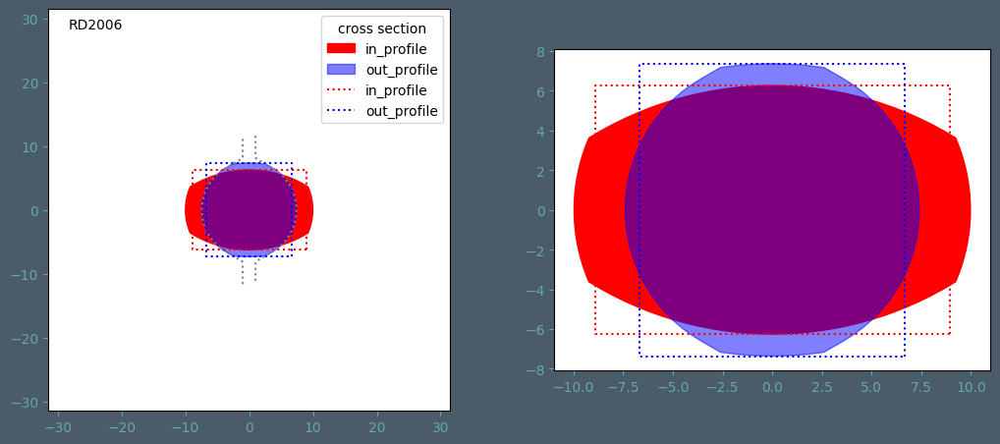

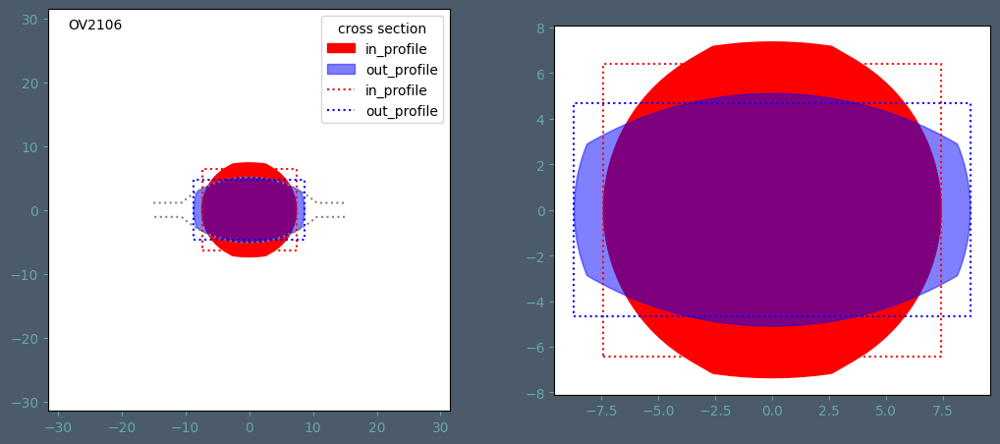

...

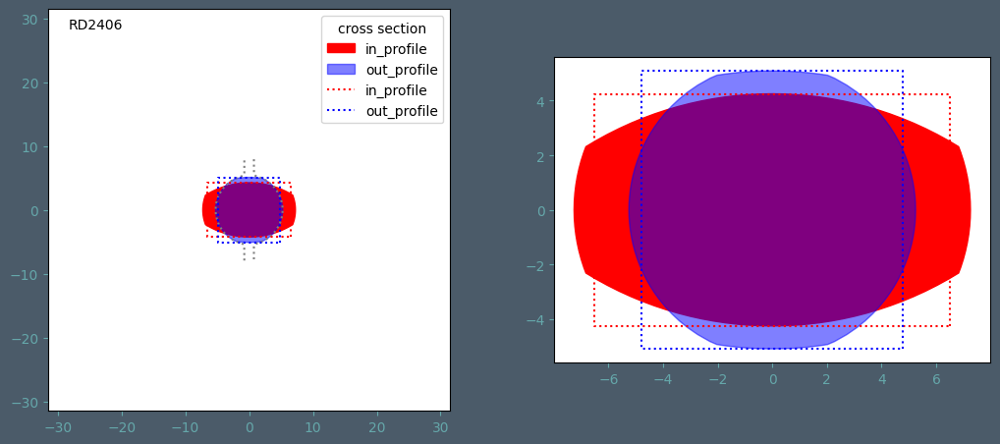

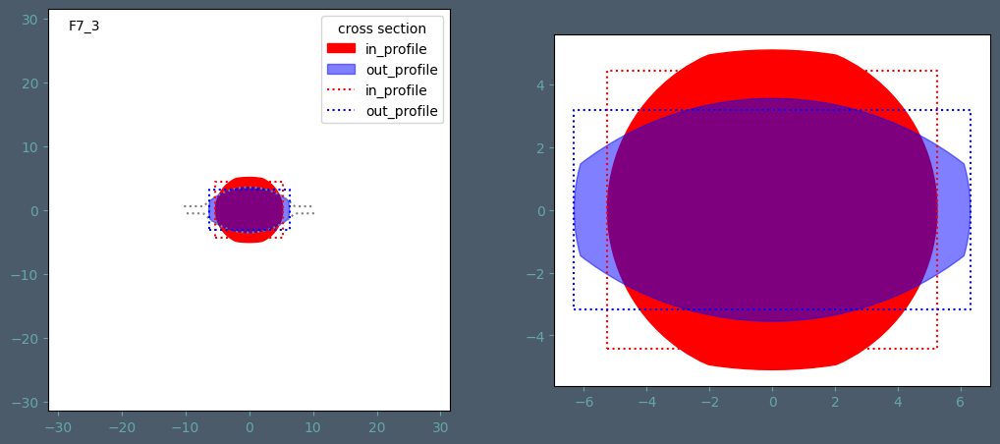

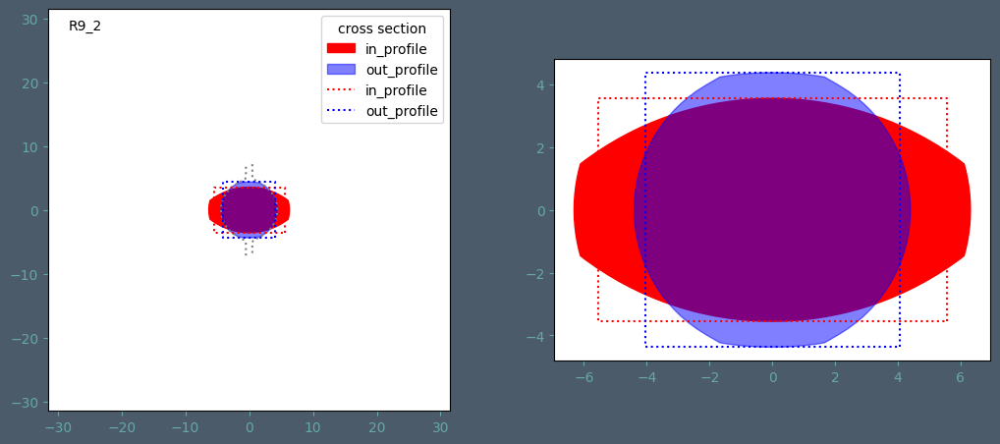

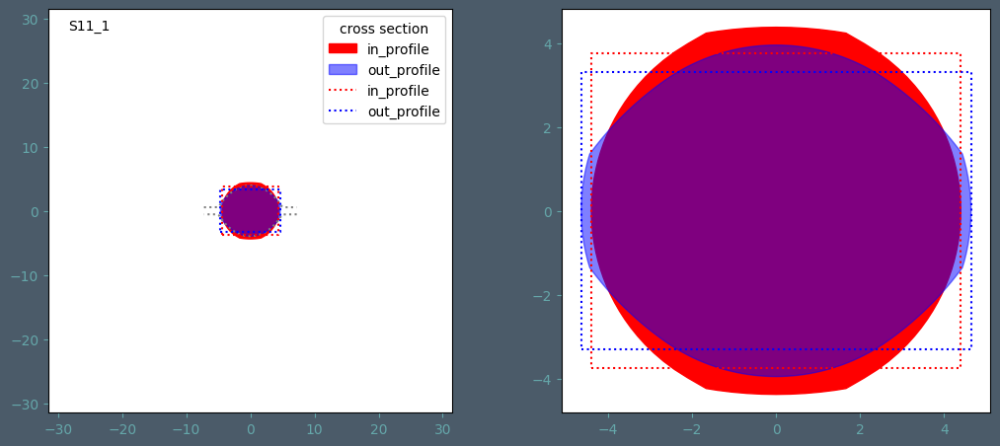

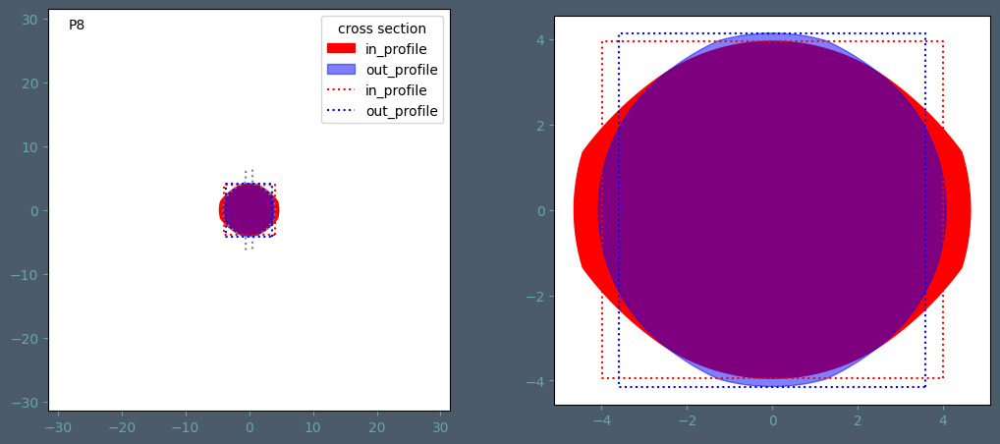

In [54]:
helpers.ComparisonPlot(df, ['in_profile_cross_section', 'out_profile_cross_section', 'cross section'],
                         limit,
                         prs, layouts, 'Title_Only', 'with equivalent rectangle', True, True)

### Example sequence plot lendl sections

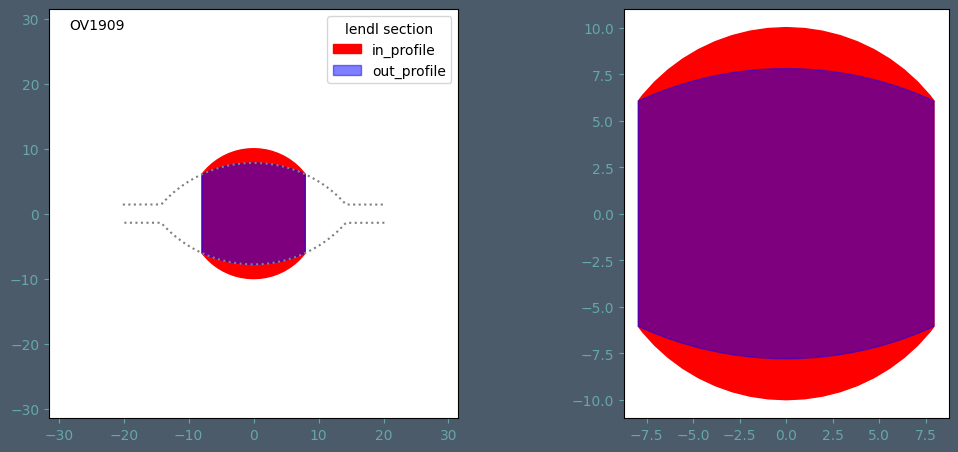

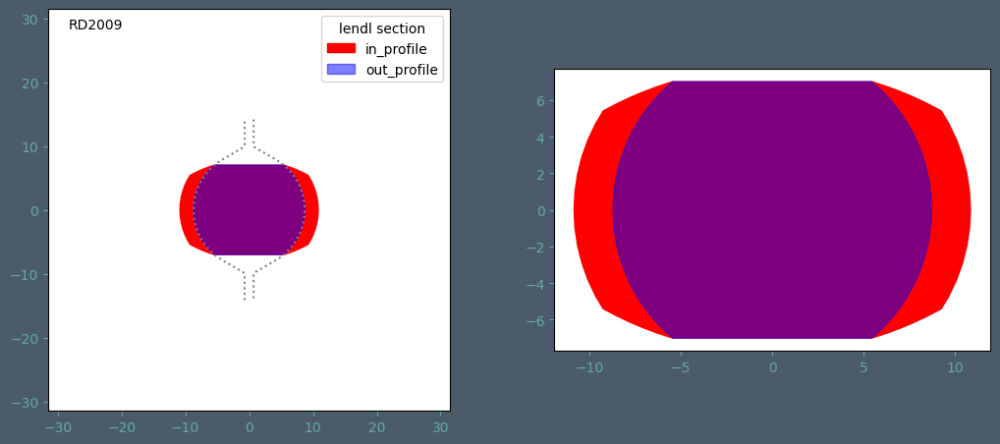

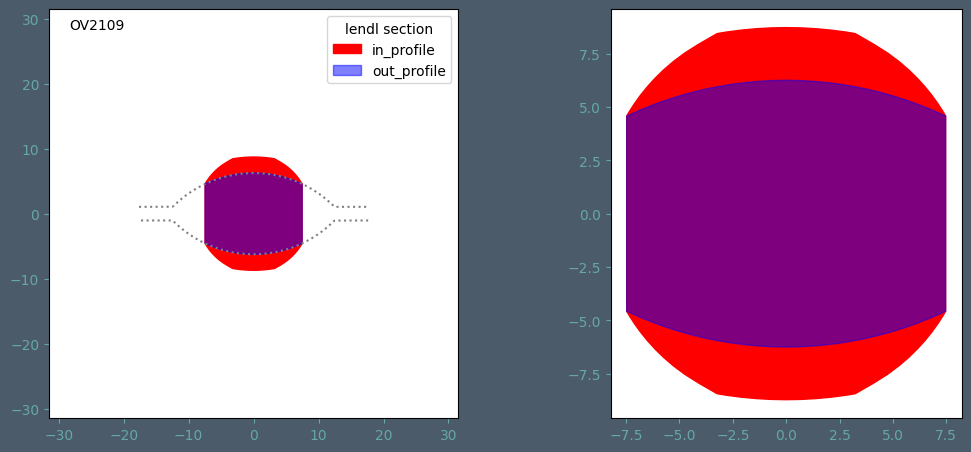

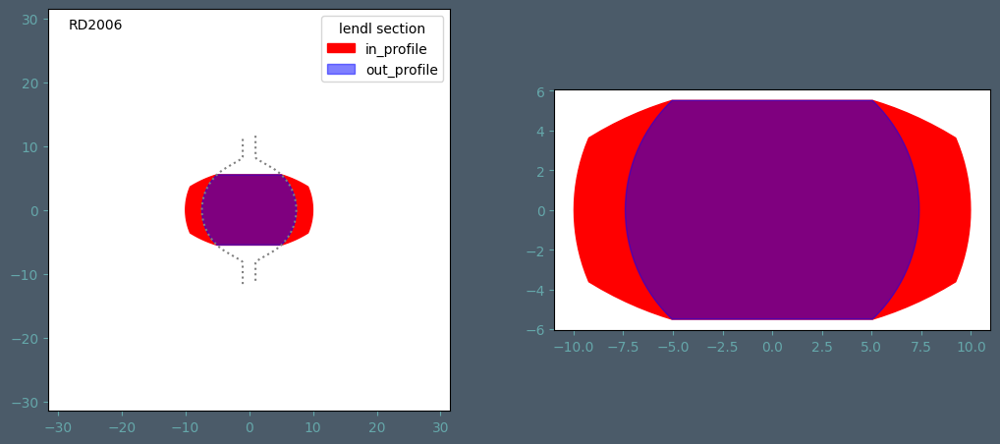

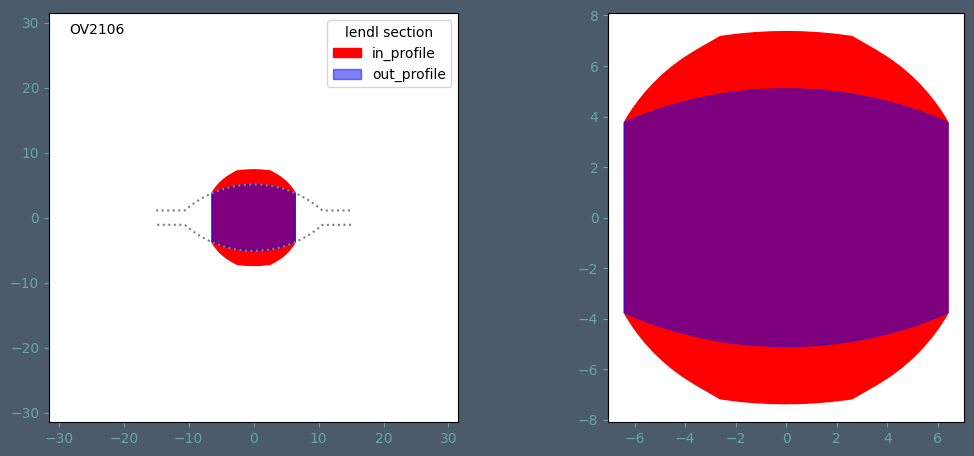

...

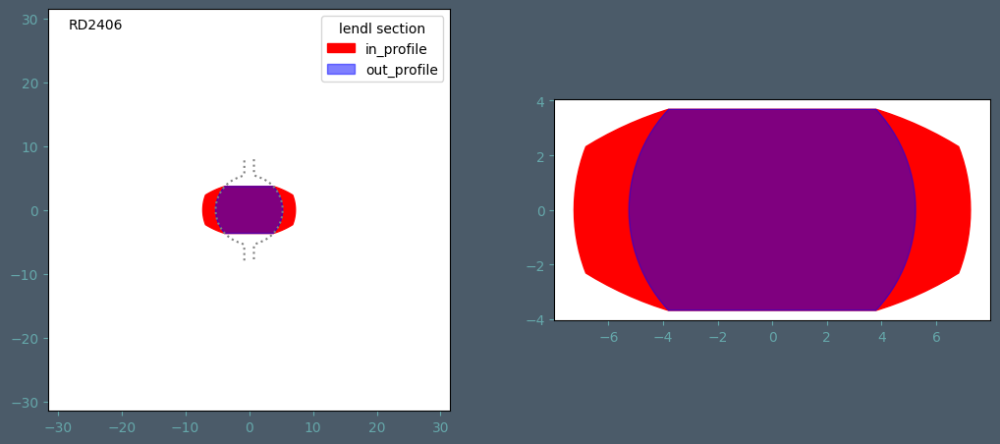

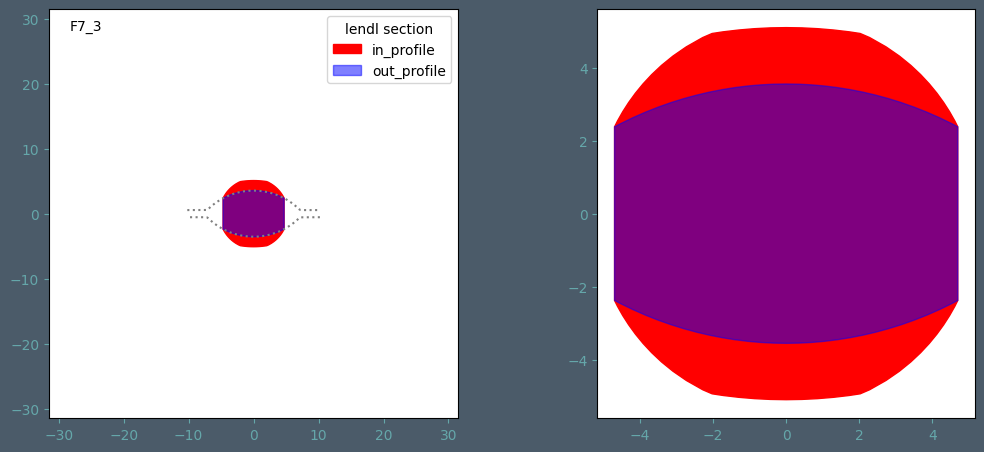

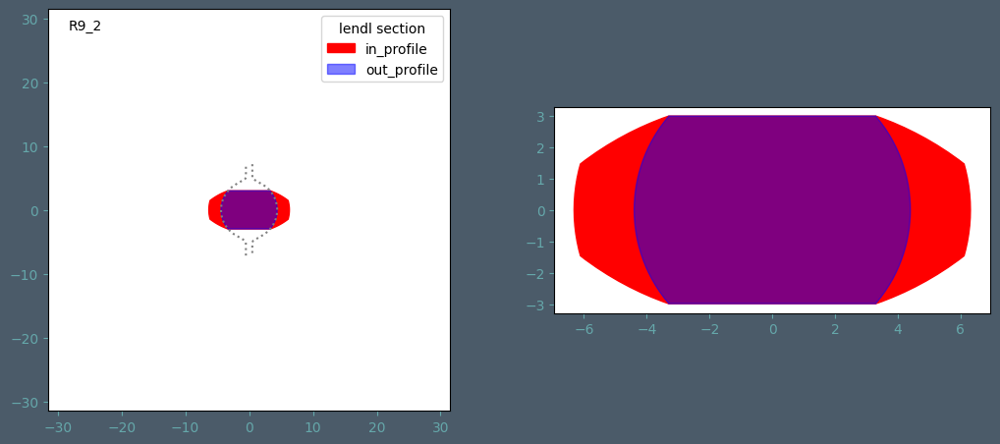

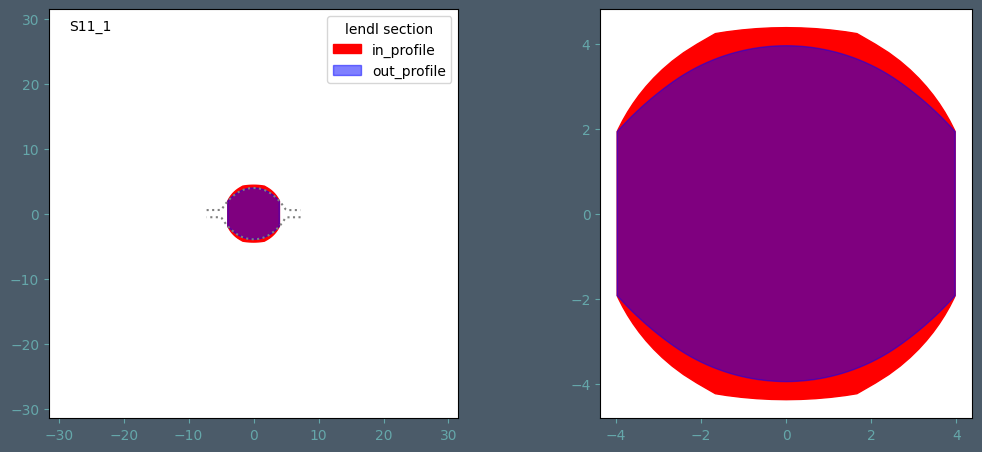

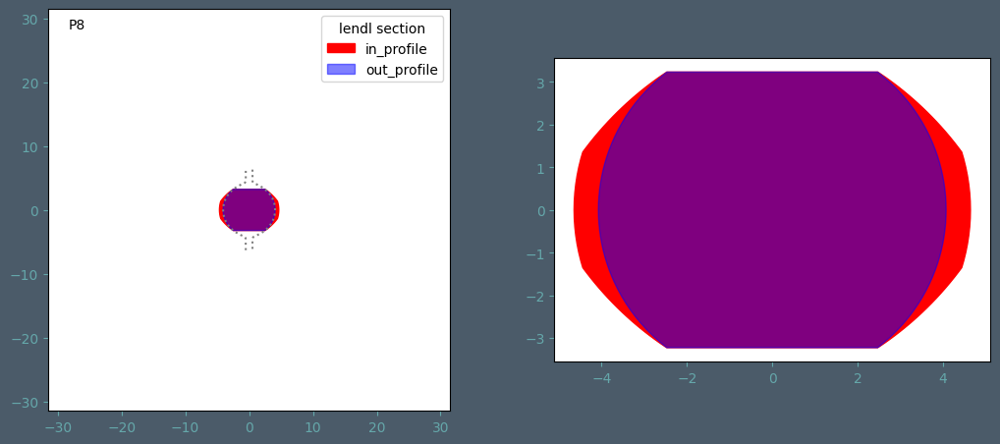

In [55]:
helpers.ComparisonPlot(df, ['in_profile_lendl_section', 'out_profile_lendl_section', 'lendl section'],
                         limit,
                         prs, layouts, 'Title_Only', 'lendl sections', True)

### Example sequence plot of disappearing and reappearing cross_sections

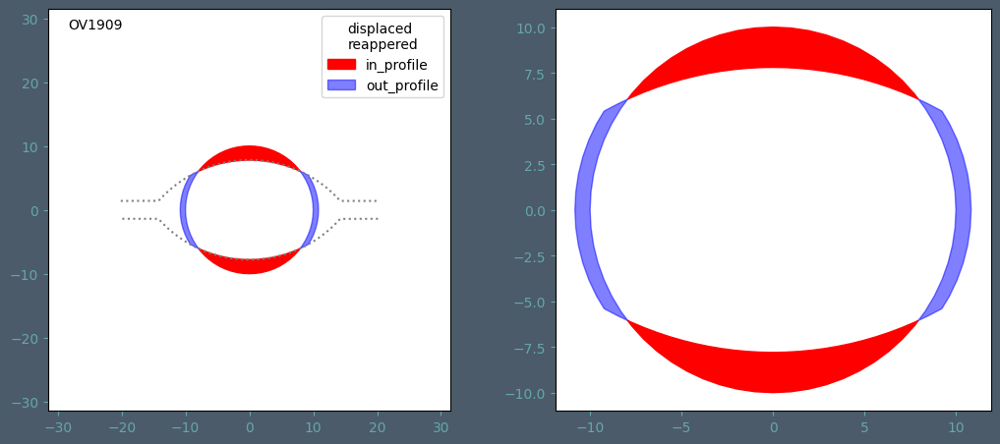

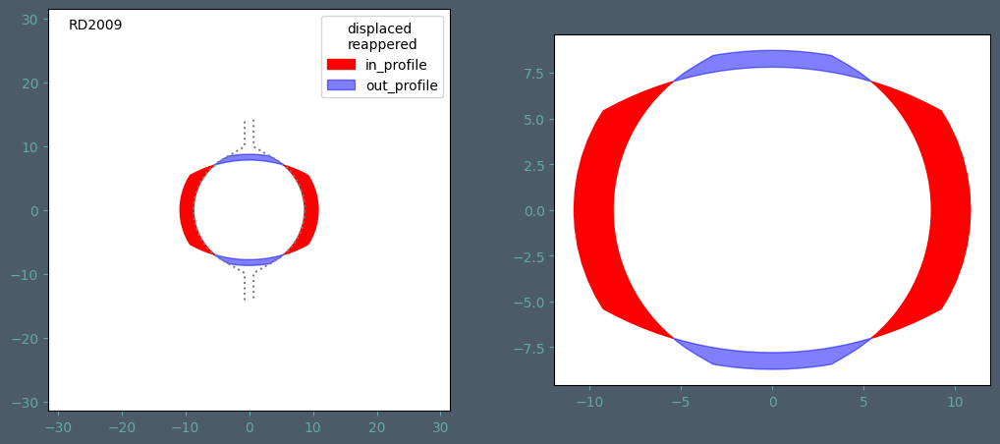

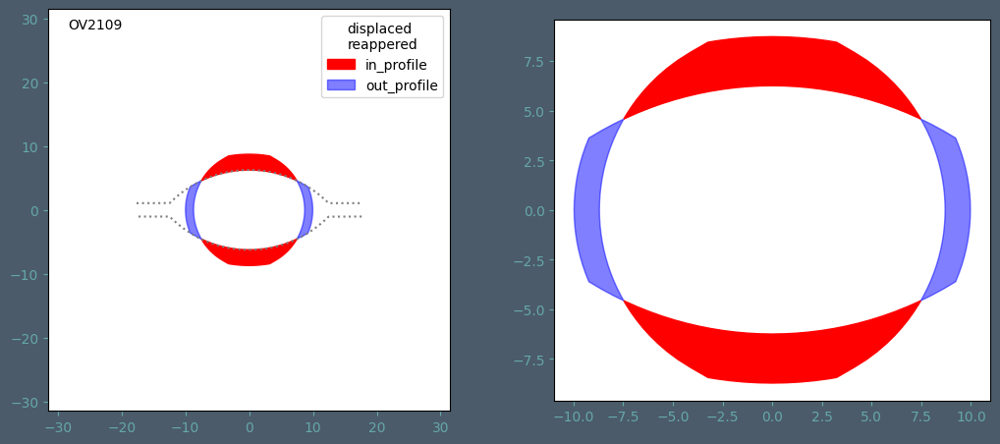

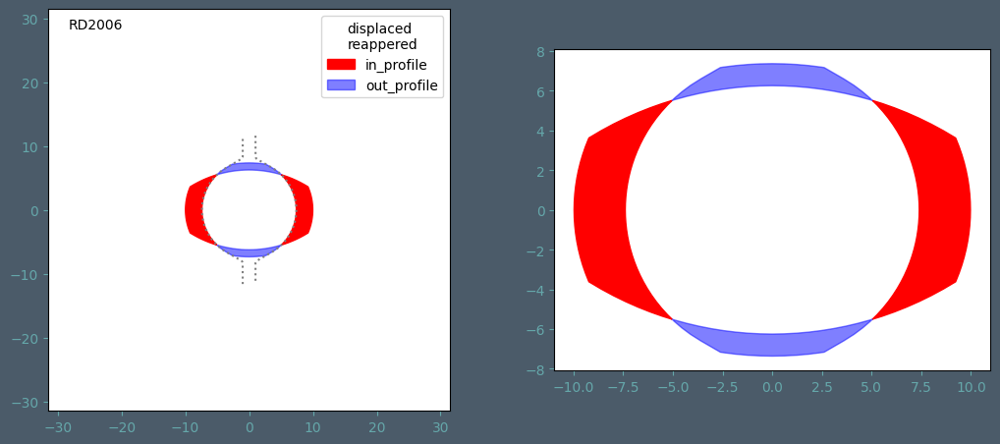

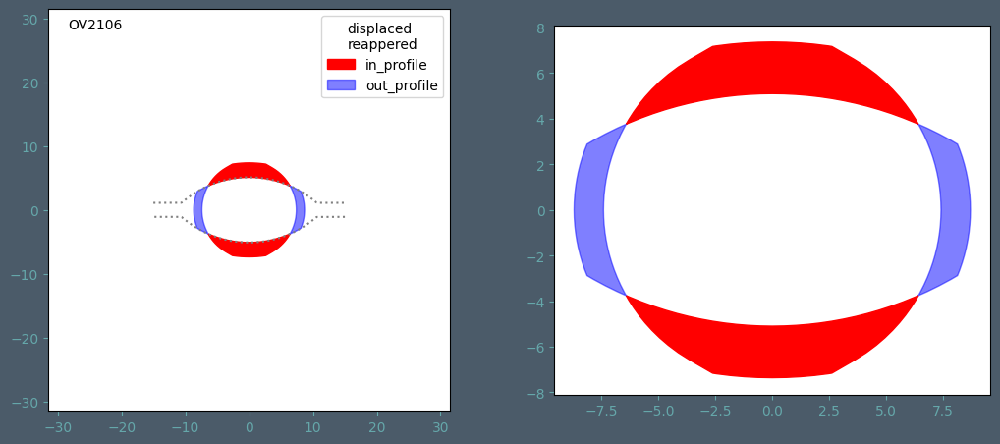

...

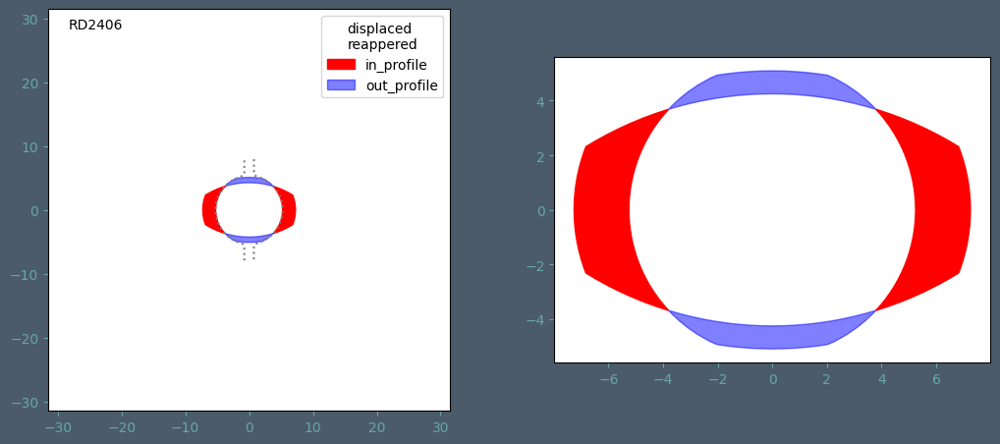

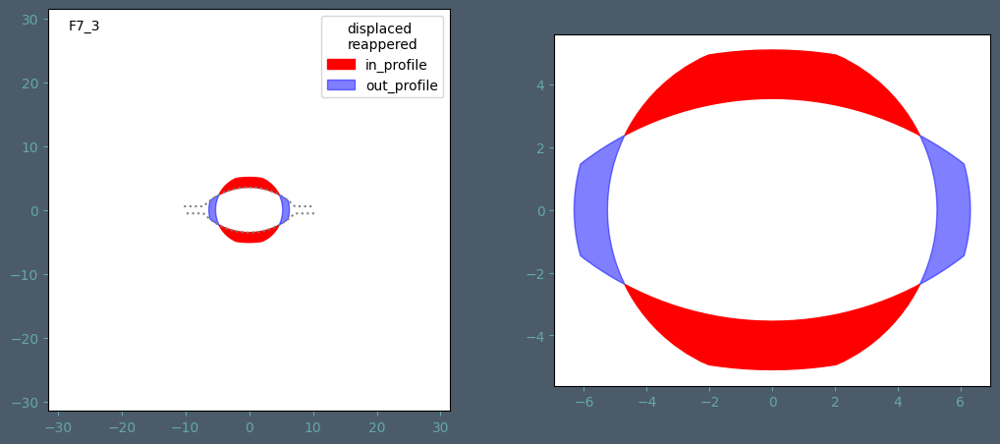

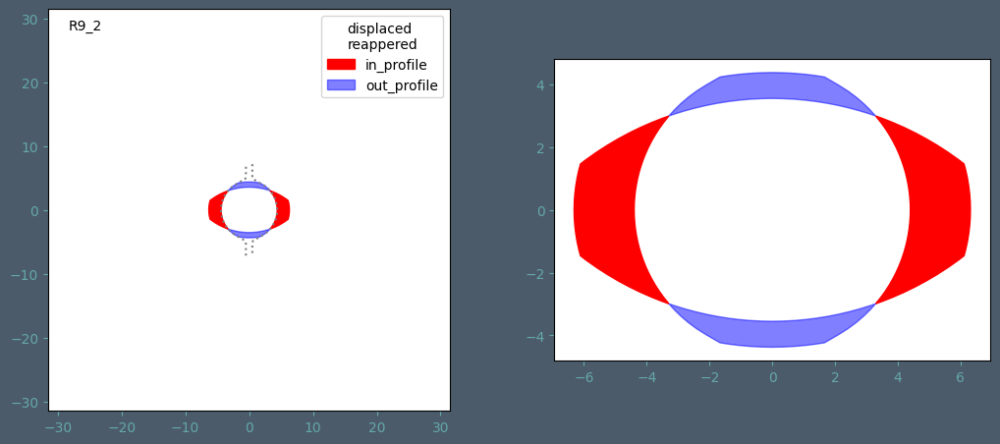

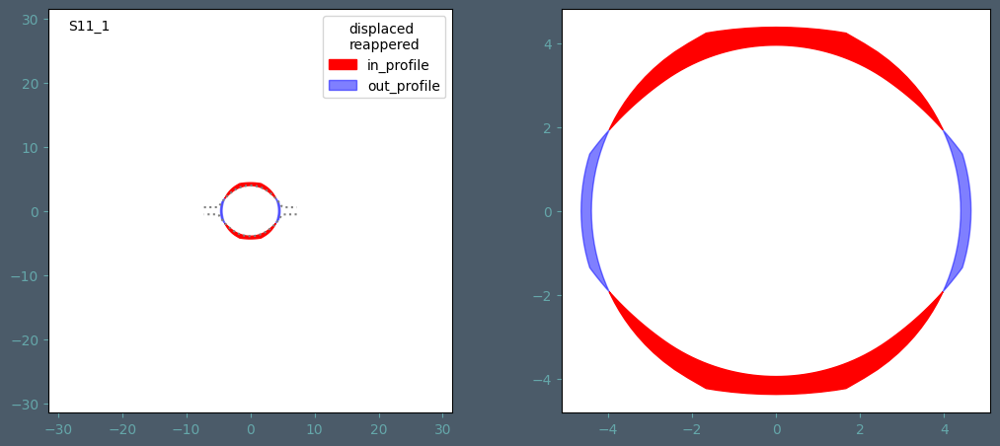

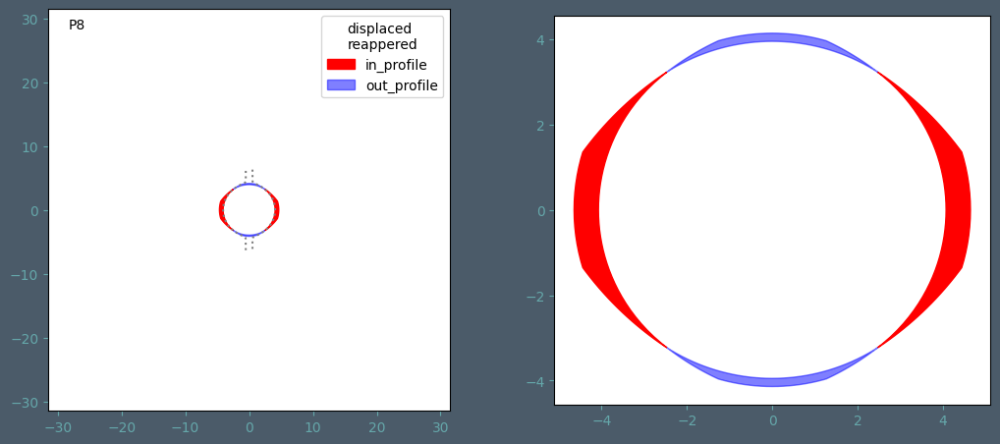

In [56]:
helpers.ComparisonPlot(df, ['displaced_cross_section', 'reappearing_cross_section', 'displaced\nreappered'],
                         limit,
                         prs, layouts, 'Title_Only', 'disappearing and reappearing', True)

### Example sequence plot usable cross section

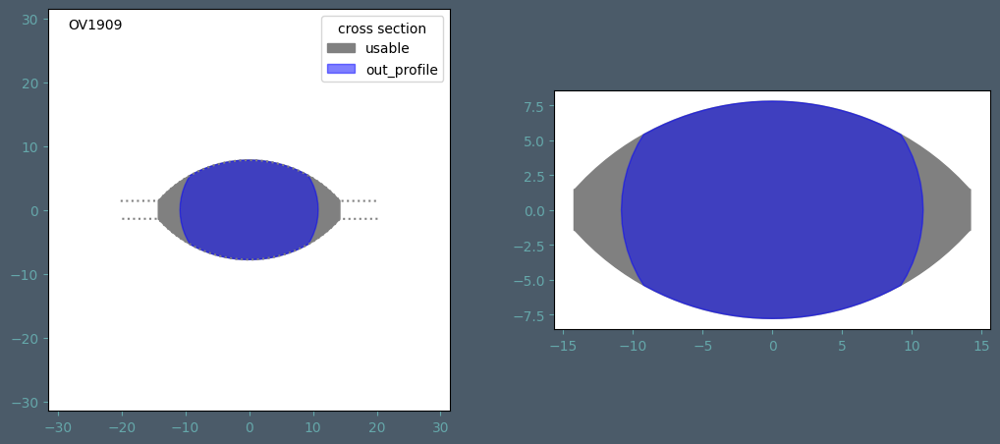

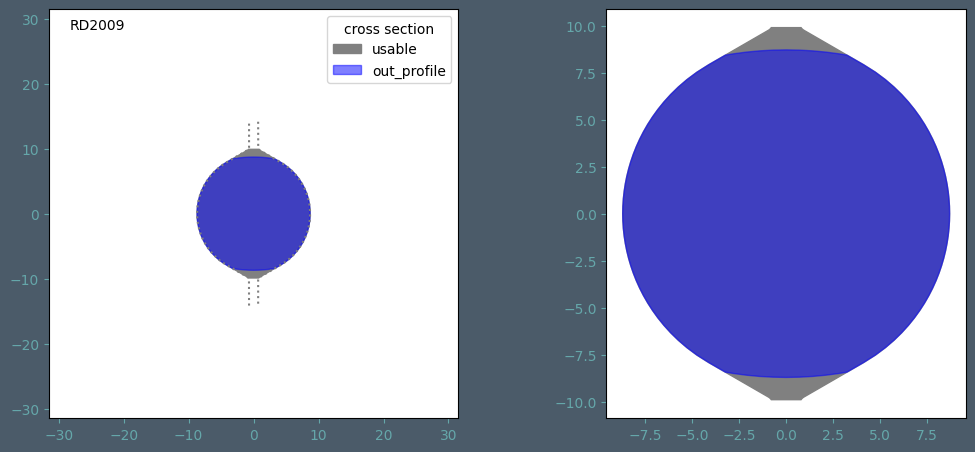

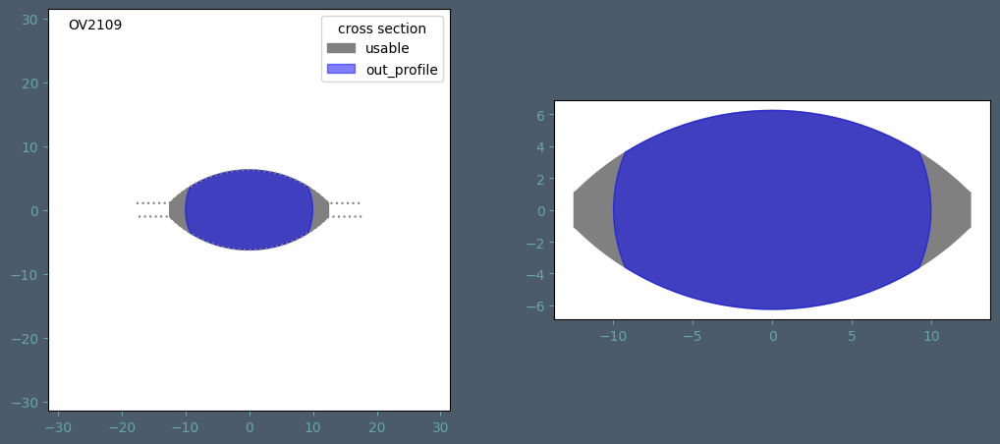

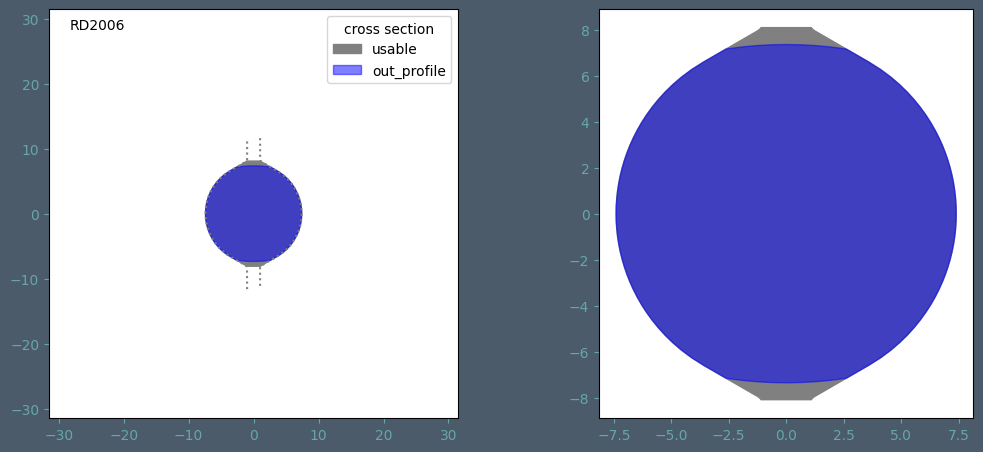

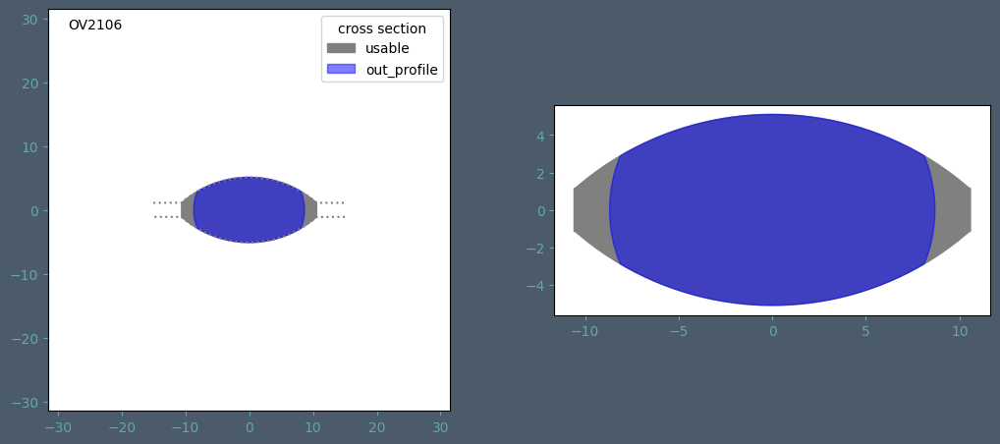

...

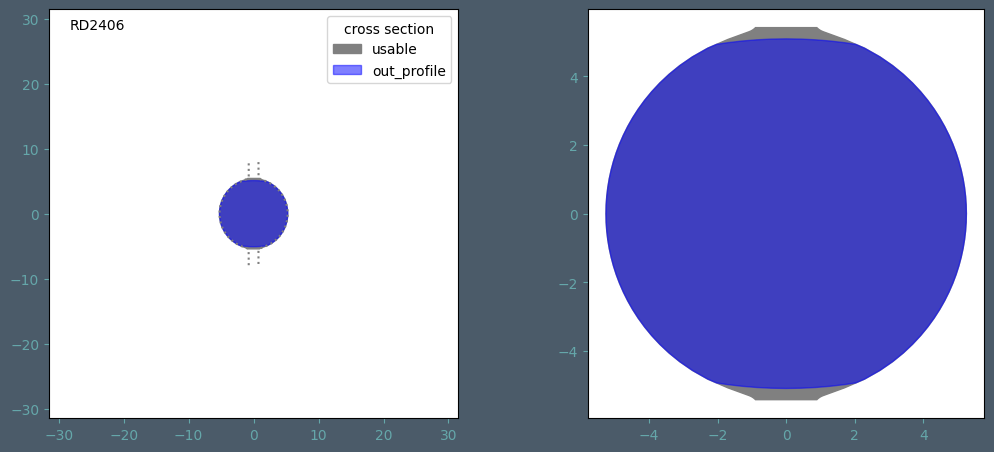

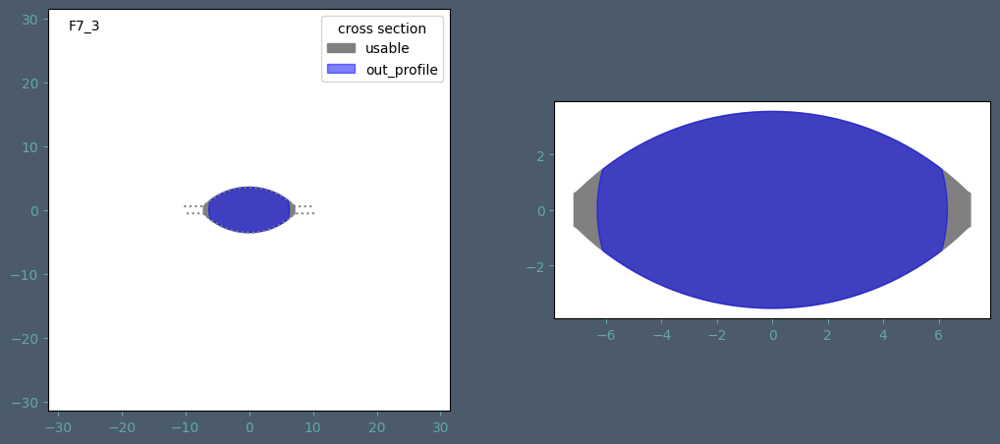

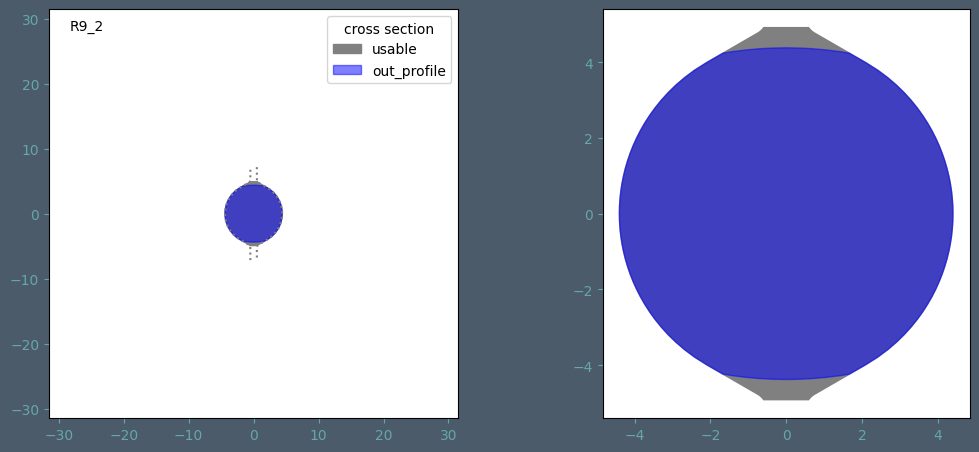

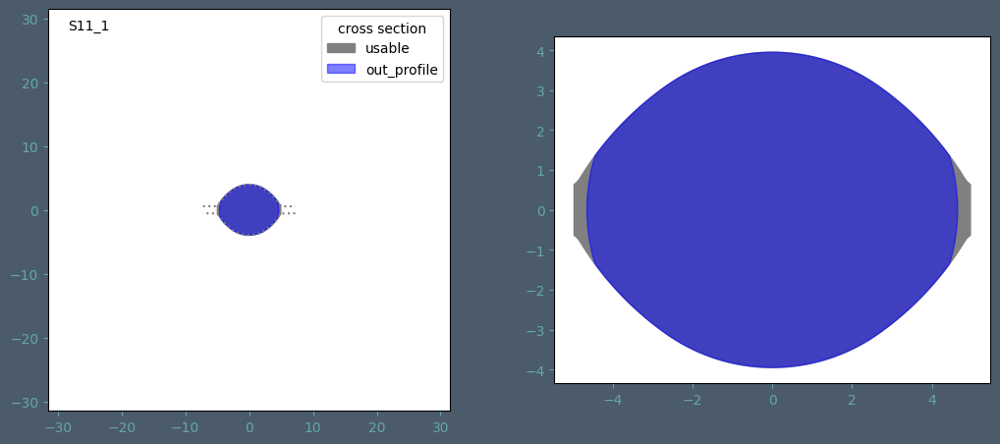

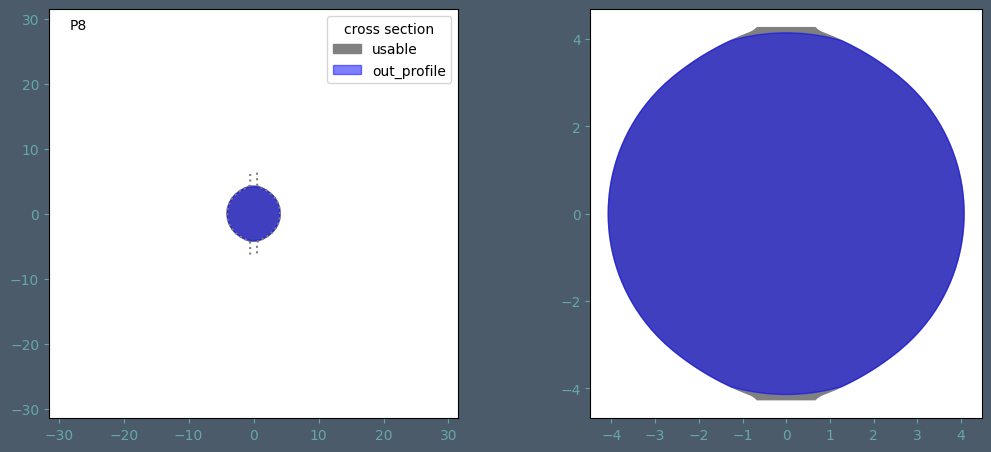

In [57]:
helpers.ComparisonPlot(df, ['usable_cross_section', 'out_profile_cross_section', 'cross section'],
                         limit,
                         prs, layouts, 'Title_Only', 'usable cross section', True)

### Example sequence plot contact area estimation

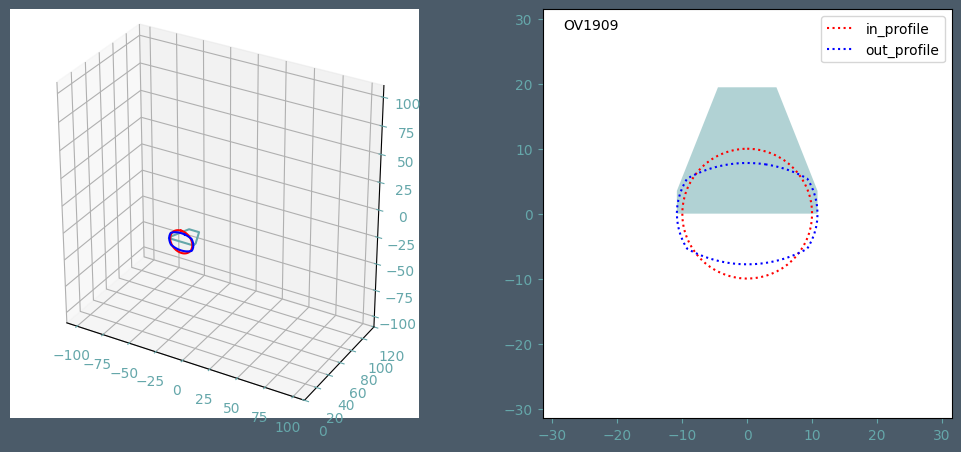

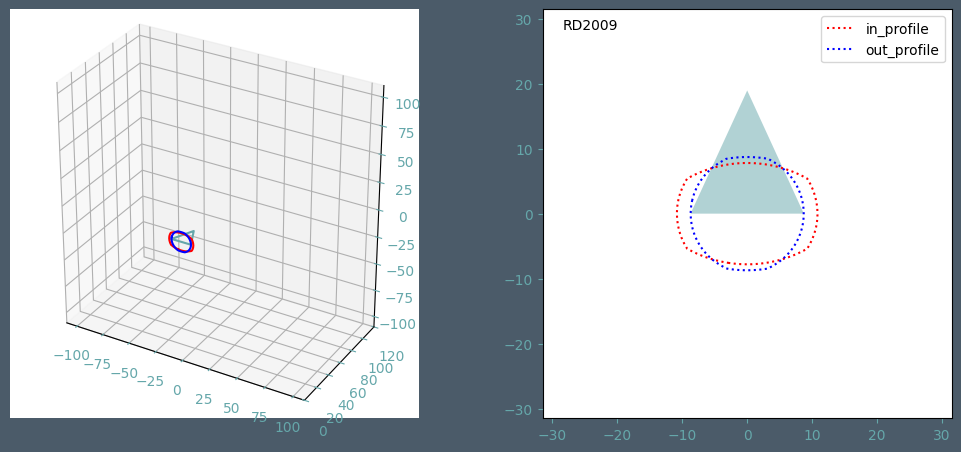

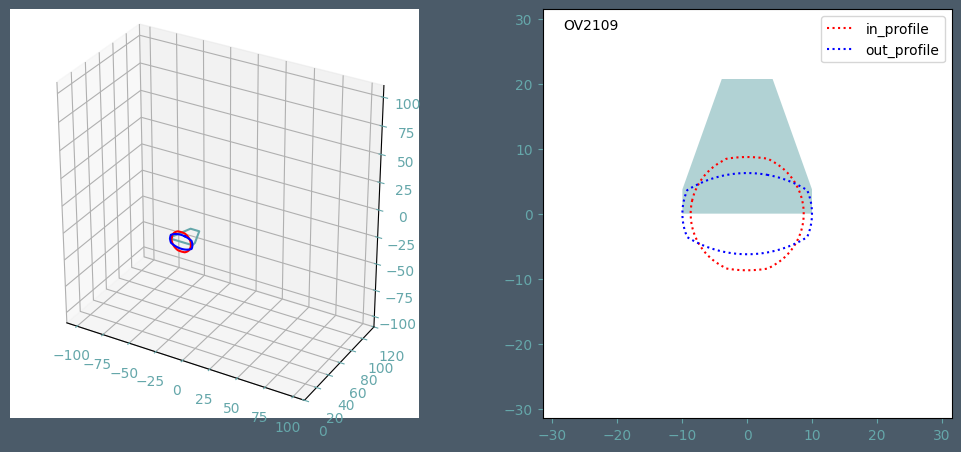

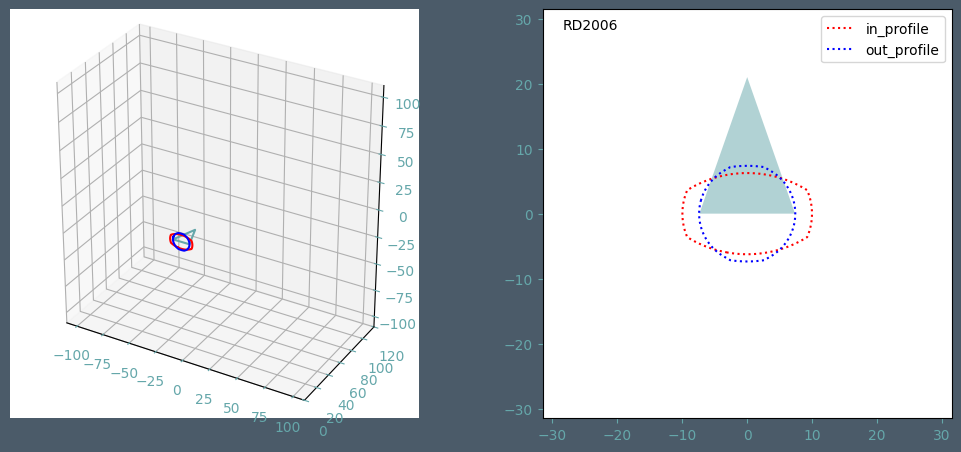

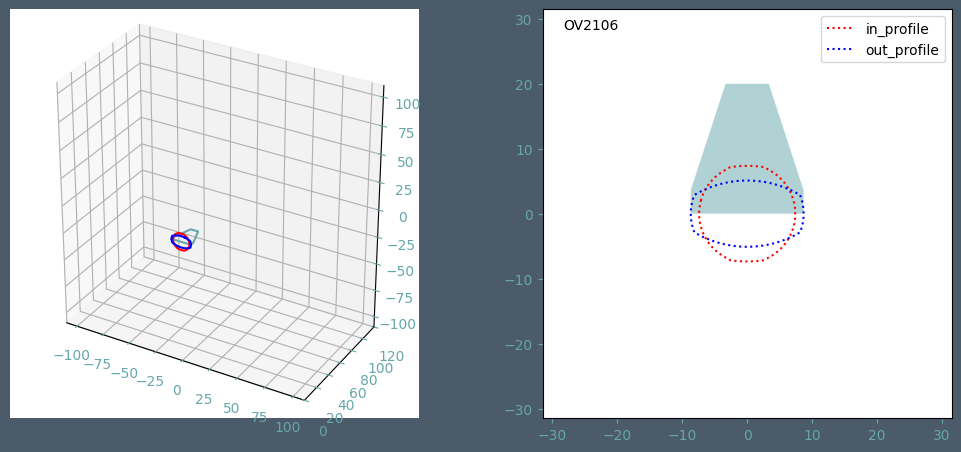

...

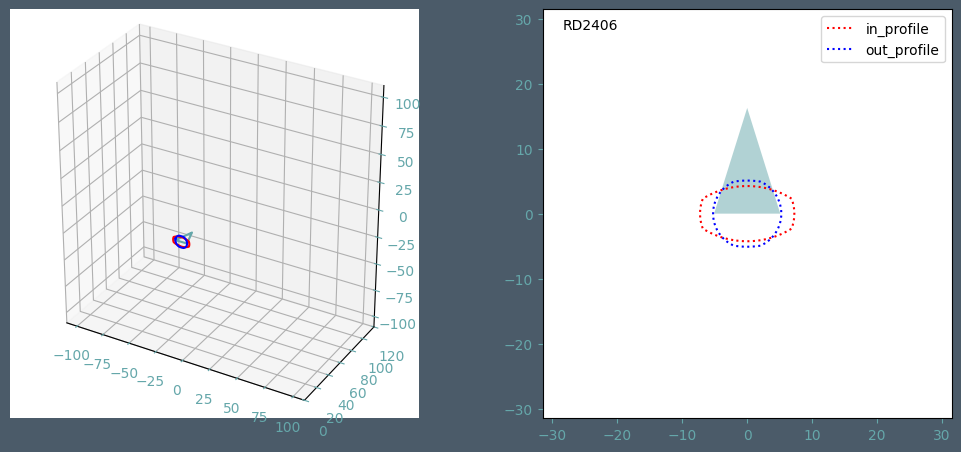

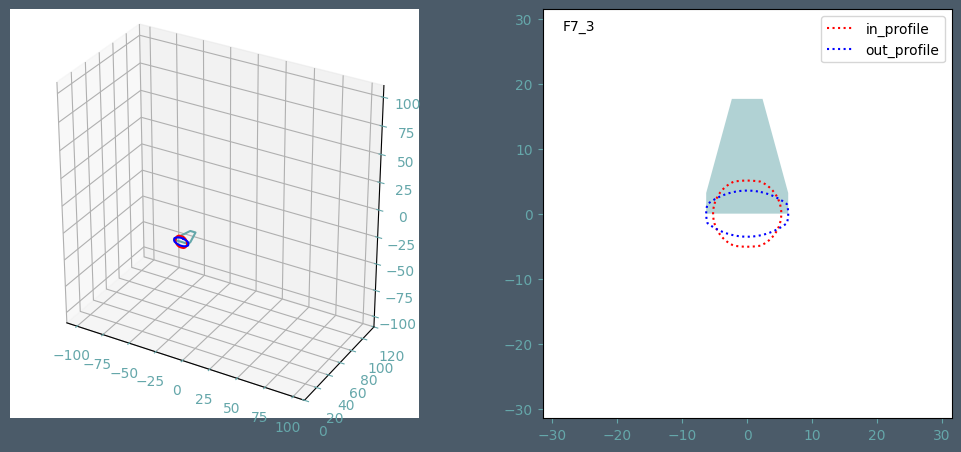

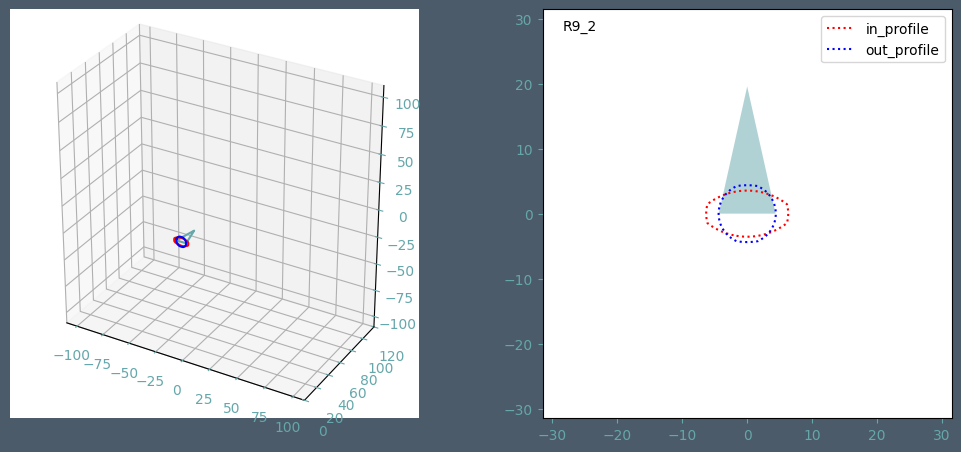

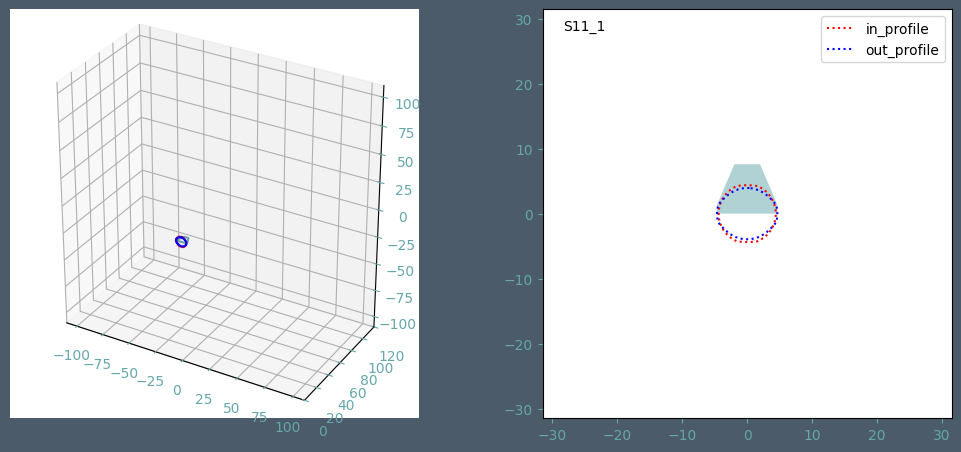

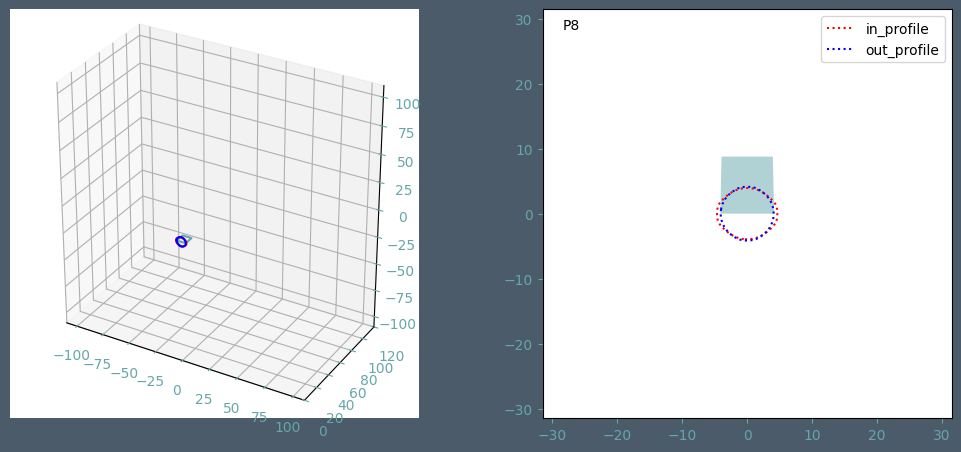

In [58]:
helpers.ContactAreaPlot(df, ['in_profile_cross_section', 'out_profile_cross_section', 'contur'],
                        limit,
                        prs, layouts, 'Title_Only', 'contact area estimation')

### Example sequence plot out_profile in polar coordinates

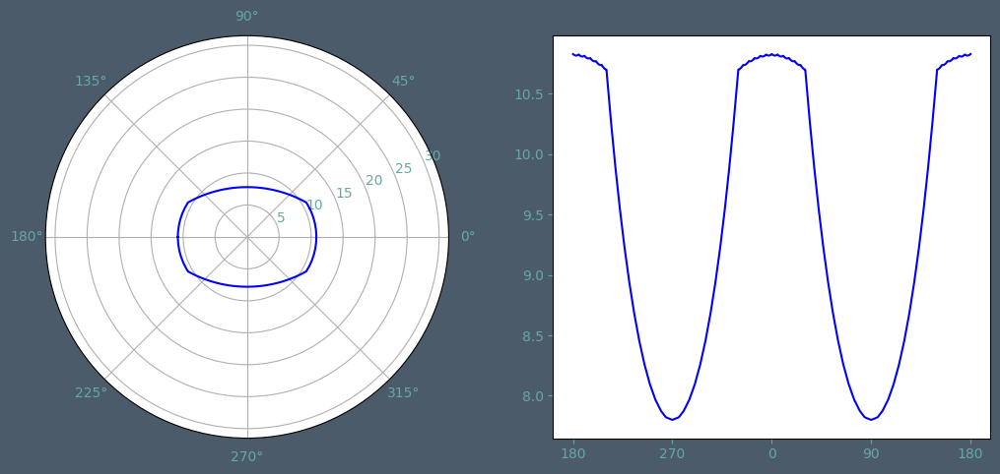

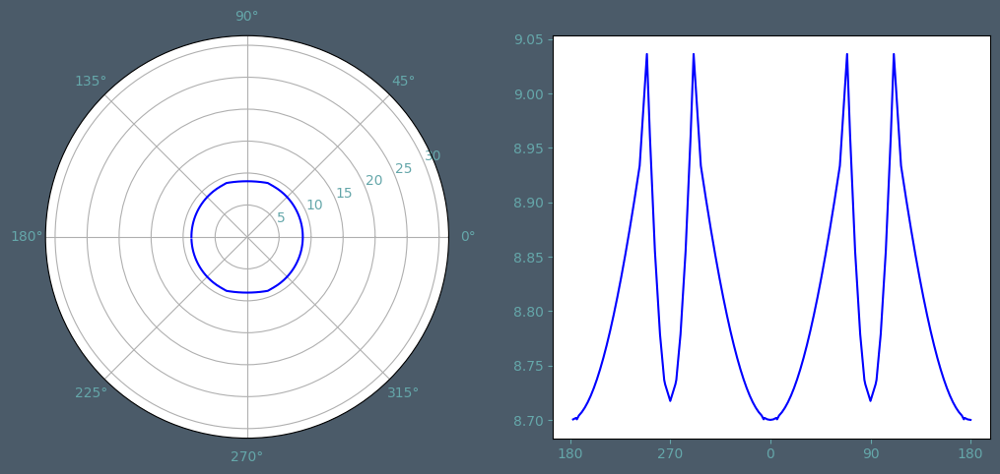

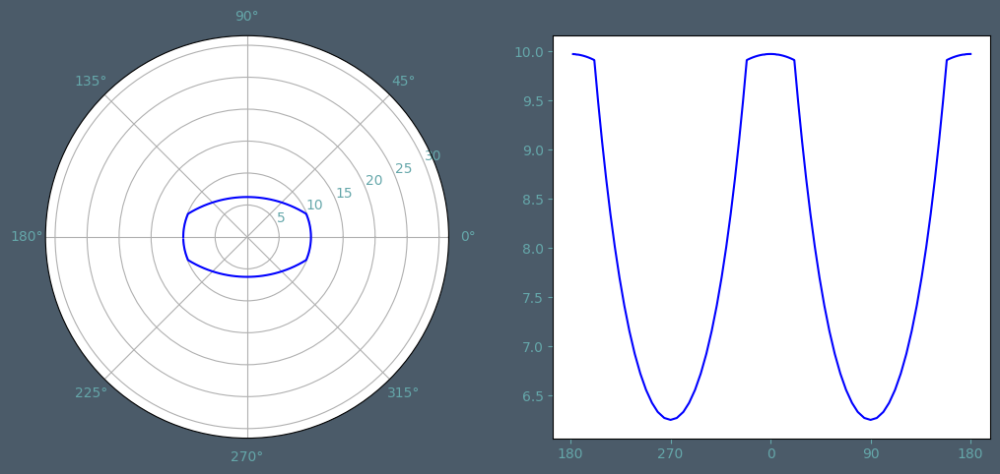

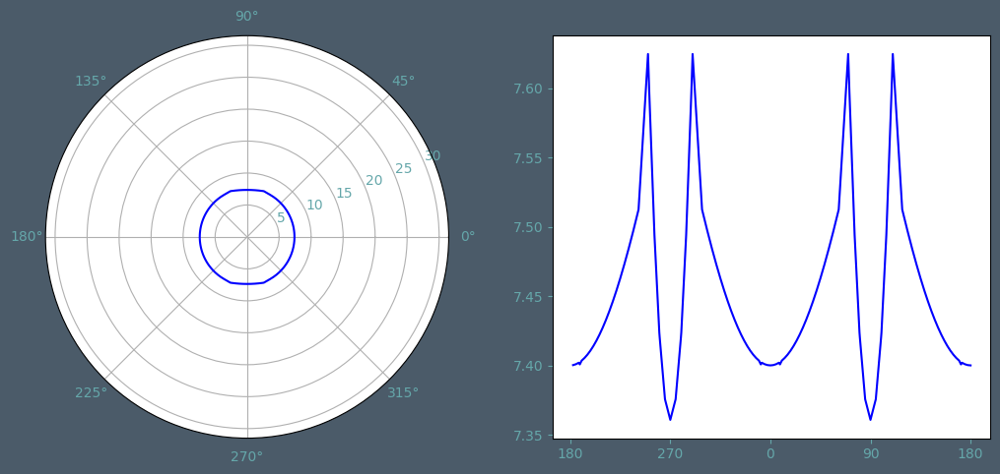

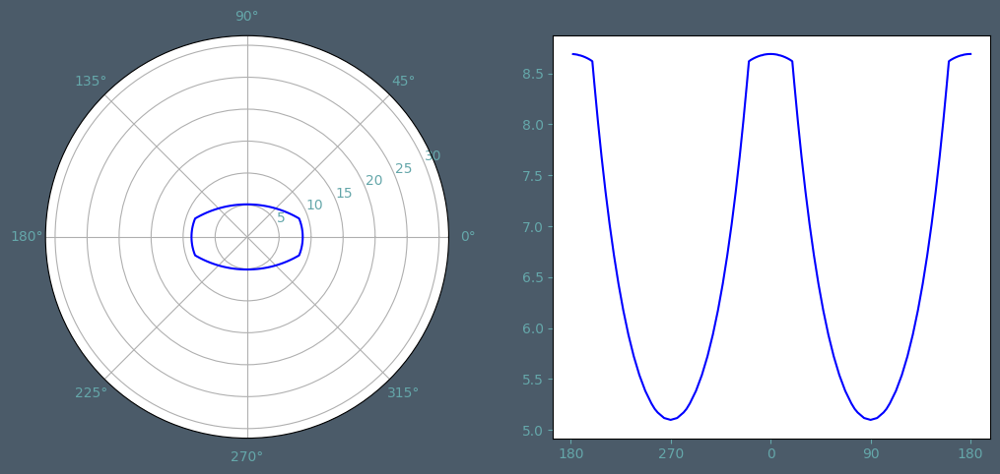

...

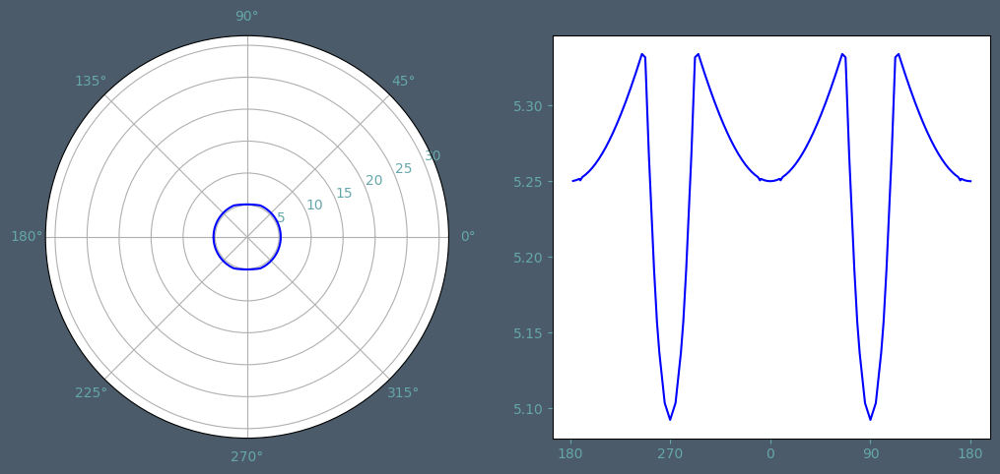

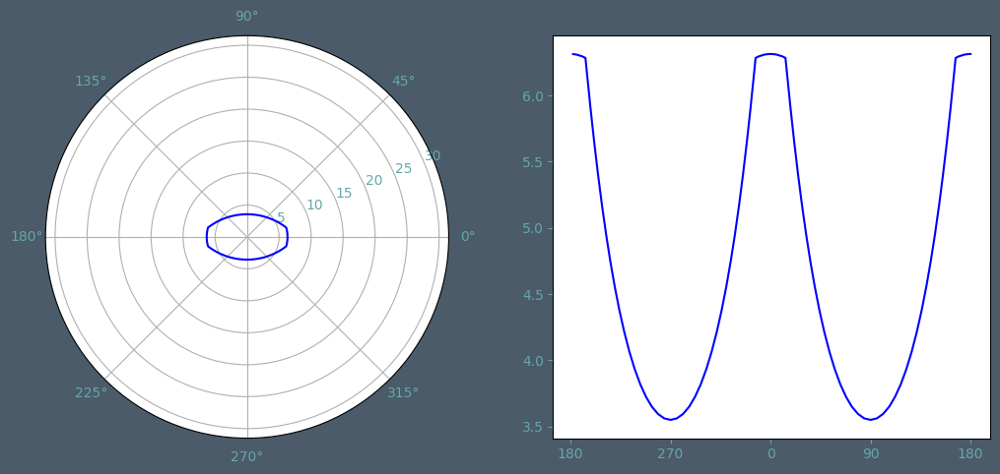

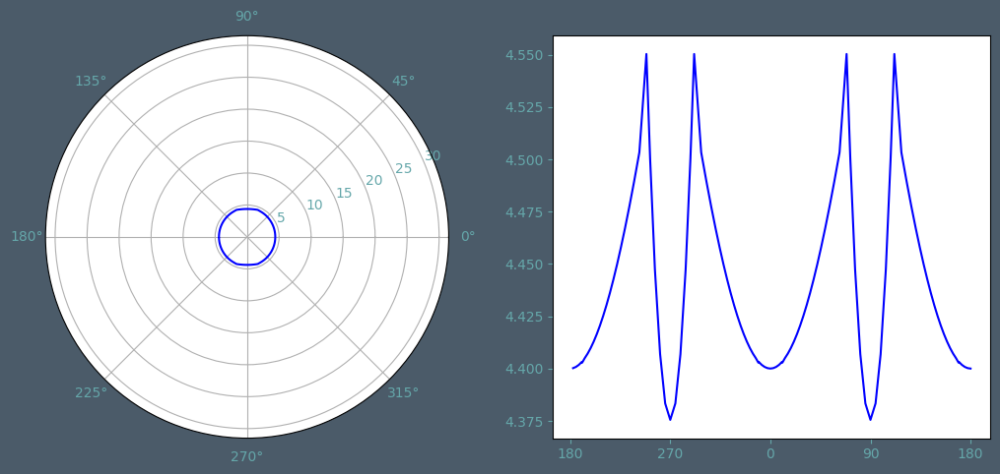

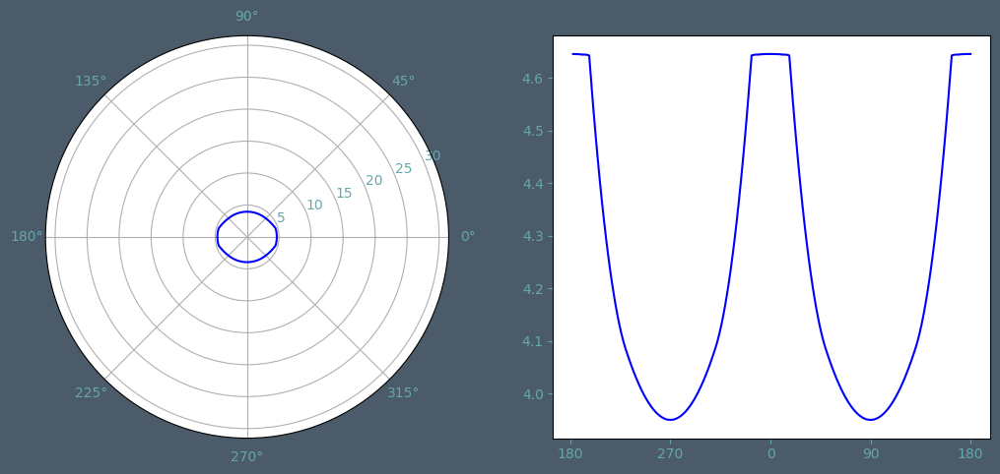

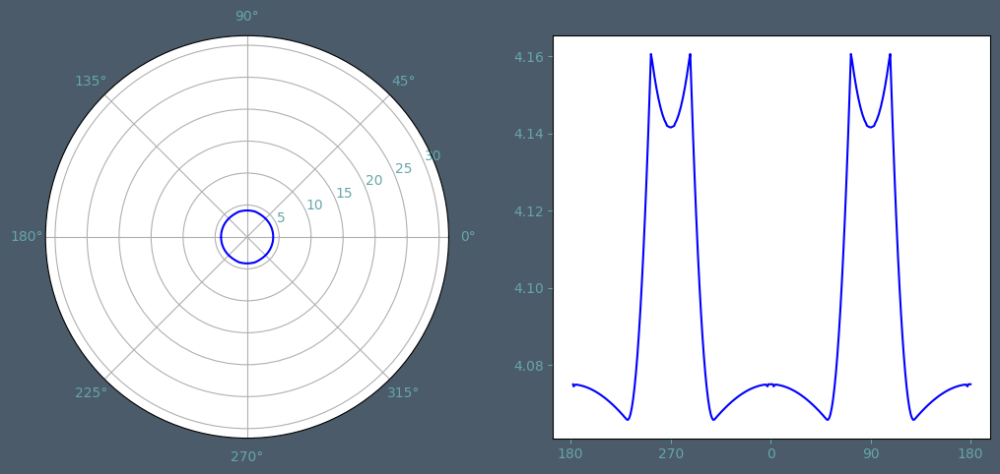

In [59]:
fig = helpers.ComparisonPlot_polar(df, 'out_profile_cross_section_polar',
                               rmax,
                               prs, layouts, 'Title_Only', 'polar coordinates')

### Example for adding powerpoint charts to report

In [60]:
ChartSlides = {
                'Walzmoment [kNm]': 'roll_roll_torque',
                'Walzkraft [kN]': 'roll_force',
                'Reduktion [%]': 'reduction',
                'Querschnittsfläche [mm²]': 'out_profile_cross_section_area',
                'Höhenabnahme [mm]': 'hred',
                'Höhenabnahmeverhältnis': 'draught',
                'Greifwinkel [°]': 'roll_entry_angle',
                'Walzendurchmesser [mm]': 'roll_nominal_diameter',
                'Arbeitsdurchmesser [mm]': 'roll_working_diameter',
                'Stabtemperatur [°C]': 'in_profile_temperature',
                'Breitung': 'spread',
                'Streckung': 'elongation',
                'Kaliberfüllgrad': 'out_profile_cross_section_filling_ratio',
                'Walzgeschwindigkeit [m/s]': 'velocity',
                'Motordrehzahl [1/min]': 'motor_rpms',
                'Motorpower [kW]': 'power',
                'Umformgeschwindigkeit [s^-1]': 'strain_rate'
                }

helpers.AddChartSlide(Sequence_1, df, ChartSlides, prs, layouts)

In [61]:
if FUNC_SOURCE:
    ??helpers.AddChartSlide

### Visualisation of individual passes

In [62]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[0]

TwoRollPass(
    abs_draught=-0.003154738929432929,
    back_tension=0,
    classifiers={'circular_oval', 'generic_elongation', 'oval', 'symmetric'},
    contact_area=np.float64(0.0006407377426326176),
    contour_lines=MultiLineString(
        height=0.015600000000000001,
        length=0.08781665836165559,
        width=0.04026702138280089,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'OV1909'},
     {'iteration': 2,
      'residuum': np.float64(0.1965272876912353),
      'label': 'OV1909'},
     {'iteration': 3,
      'residuum': np.float64(0.192304582550044),
      'label': 'OV1909'},
     {'iteration': 4,
      'residuum': np.float64(0.005641142990630865),
      'label': 'OV1909'},
     {'iteration': 5,
      'residuum': np.float64(0.005641142990630862),
      'label': 'OV1909'},
     {'iteration': 6,
      'residuum': np.float64(0.00011354040017692926),
      'label': 'OV1909'},
     {'iteration': 7,
      'residuum': np.float64(1.5823327522458146),
      'label': 'OV1909'},
     {'iteration': 8,
      'residuum': np.float64(2.7172312498904643),
      'label': 'OV1909'},
     {'iteration': 9,
      'residuum': np.float64(0.009978907494147933),
      'label': 'OV1909'},
     {'iteration': 10,
      'residuum': np.float64(0.00997890749414786),
      'label': 'OV1909'},
     {'iteration': 11,
      'residuum': np.float64(0.00021722276777410155),
      'label': 'OV1909'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(378105455.8477727),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=5.011929925808698e-05,
        height=0.02,
        perimeter=0.06954670035091078,
        width=0.01588698791855211,
        ),
    draught=0.8208755159089459,
    duration=np.float64(0.0011608345688357469),
    elongation=1.1099546132040248,
    elongation_efficiency=0.6199479815450579,
    entry_point=np.float64(-0.019452506265260523),
    exit_point=0,
    first_marini_parameter=np.float64(0.11674460892026435),
    front_tension=0,
    gap=np.float64(0.0028),
    global_iterator=12,
    height=np.float64(0.015600000000000001),
    in_profile=InProfile(
        classifiers={'rotated', 'round', 'vertical'},
        cross_section=Polygon(
            area=0.00031365484905459433,
            height=0.02,
            perimeter=0.06280662313909656,
            width=0.02,
            ),
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.0176119917131445,
        equivalent_rectangle=Polygon(
            area=0.00035223983426288996,
            height=0.0176119917131445,
            perimeter=0.075223983426289,
            width=0.02,
            ),
        equivalent_width=np.float64(0.02),
        flow_stress=np.float64(278278763.78047884),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.02),
        lendl_section=Polygon(
            area=0.0002798014995683666,
            height=0.02,
            perimeter=0.06098643425921364,
            width=0.015886987918552115,
            ),
        length=0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=0,
        temperature=1153.15,
        thermal_conductivity=47,
        velocity=np.float64(15.097325225998997),
        width=np.float64(0.02),
        ),
    inverse_forming_efficiency=np.float64(1.2268491729721454),
    iteration_precision=0.001,
    label='OV1909',
    lendl_width=0.015886987918552115,
    length=np.float64(0.019452506265260523),
    log_draught=np.float64(-0.19738380598458793),
    log_elongation=np.float64(0.10431912548288151),
    log_spread=np.float64(0.079725975

In [63]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[2]

TwoRollPass(
    abs_draught=-0.003944222978168824,
    back_tension=0,
    classifiers={'false_round', 'generic_elongation', 'round', 'symmetric'},
    contact_area=np.float64(0.0003306521804887143),
    contour_lines=MultiLineString(
        height=0.0174,
        length=0.07092379743127886,
        width=0.028301710195675456,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'RD2009'},
     {'iteration': 2,
      'residuum': np.float64(0.568609951237034),
      'label': 'RD2009'},
     {'iteration': 3,
      'residuum': np.float64(0.2355190947232282),
      'label': 'RD2009'},
     {'iteration': 4,
      'residuum': np.float64(0.00799633153348259),
      'label': 'RD2009'},
     {'iteration': 5,
      'residuum': np.float64(0.007996331533482648),
      'label': 'RD2009'},
     {'iteration': 6,
      'residuum': np.float64(0.00016931276633787667),
      'label': 'RD2009'},
     {'iteration': 7,
      'residuum': np.float64(0.23373037056765203),
      'label': 'RD2009'},
     {'iteration': 8,
      'residuum': np.float64(0.3050236647651028),
      'label': 'RD2009'},
     {'iteration': 9,
      'residuum': np.float64(0.0068402778987345396),
      'label': 'RD2009'},
     {'iteration': 10,
      'residuum': np.float64(0.00684027789873444),
      'label': 'RD2009'},
     {'iteration': 11,
      'residuum': np.float64(0.00016987148987266103),
      'label': 'RD2009'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(380666338.9839101),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=5.525401090202297e-05,
        height=0.02165980523020631,
        perimeter=0.07131461328852344,
        width=0.0140088456478888,
        ),
    draught=0.7961422301318091,
    duration=np.float64(0.000975048980775538),
    elongation=1.160712299245309,
    elongation_efficiency=0.7081210497221333,
    entry_point=np.float64(-0.01896514861615422),
    exit_point=0,
    first_marini_parameter=np.float64(0.13109401765059386),
    front_tension=0,
    gap=np.float64(0.0014),
    global_iterator=12,
    height=np.float64(0.0174),
    in_profile=InProfile(
        classifiers={'circular_oval',
         'generic_elongation',
         'oval',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.0002825834906430906,
            height=0.02165980523020631,
            perimeter=0.06141920962131886,
            width=0.015600000000000001,
            ),
        cross_section_error=-0.1482002048474791,
        cross_section_filling_ratio=0.8517997951525209,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.01934791585682044,
        equivalent_rectangle=Polygon(
            area=0.00030182748736639893,
            height=0.01934791585682044,
            perimeter=0.06989583171364089,
            width=0.015600000000000001,
            ),
        equivalent_width=np.float64(0.015600000000000001),
        filling_error=np.float64(-0.2385553633436197),
        filling_ratio=np.float64(0.7614446366563803),
        flow_stress=np.float64(280393118.4644438),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.02165980523020631),
        lendl_section=Polygon(
            area=0.0002710419668465378,
            height=0.02165980523020631,
            perimeter=0.061109974901858904,
            width=0.014008845647888802,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.04890109191177099),
        technologically_orientated_cross_section=Polygon(
          

In [64]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[4]

TwoRollPass(
    abs_draught=-0.0038741590526939484,
    back_tension=0,
    classifiers={'circular_oval', 'generic_elongation', 'oval', 'symmetric'},
    contact_area=np.float64(0.000621016888853061),
    contour_lines=MultiLineString(
        height=0.0125,
        length=0.07605608643050632,
        width=0.035270857843083585,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'OV2109'},
     {'iteration': 2,
      'residuum': np.float64(0.38670259274491525),
      'label': 'OV2109'},
     {'iteration': 3,
      'residuum': np.float64(0.29188714005689964),
      'label': 'OV2109'},
     {'iteration': 4,
      'residuum': np.float64(0.005081654250597796),
      'label': 'OV2109'},
     {'iteration': 5,
      'residuum': np.float64(0.0050816542505976985),
      'label': 'OV2109'},
     {'iteration': 6,
      'residuum': np.float64(0.0001883676459623945),
      'label': 'OV2109'},
     {'iteration': 7,
      'residuum': np.float64(0.6537422063720582),
      'label': 'OV2109'},
     {'iteration': 8,
      'residuum': np.float64(1.8880216370653364),
      'label': 'OV2109'},
     {'iteration': 9,
      'residuum': np.float64(0.009530598427860701),
      'label': 'OV2109'},
     {'iteration': 10,
      'residuum': np.float64(0.0095305984278606),
      'label': 'OV2109'},
     {'iteration': 11,
      'residuum': np.float64(0.0002570958460062639),
      'label': 'OV2109'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(394563626.8669685),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=5.789688354119198e-05,
        height=0.017434726529590723,
        perimeter=0.06716044358268747,
        width=0.014944374444547527,
        ),
    draught=0.7463816417205179,
    duration=np.float64(0.0009040722308053638),
    elongation=1.1787553799433068,
    elongation_efficiency=0.6376794850891692,
    entry_point=np.float64(-0.020727963505429065),
    exit_point=0,
    first_marini_parameter=np.float64(0.12895559426056322),
    front_tension=0,
    gap=np.float64(0.0021000000000000003),
    global_iterator=12,
    height=np.float64(0.0125),
    in_profile=InProfile(
        classifiers={'false_round',
         'generic_elongation',
         'rotated',
         'round',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.00024345696244179146,
            height=0.017434726529590723,
            perimeter=0.0554362131968399,
            width=0.0174,
            ),
        cross_section_error=-0.03620342355880002,
        cross_section_filling_ratio=0.9637965764412,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.015275546608596475,
        equivalent_rectangle=Polygon(
            area=0.00026579451098957864,
            height=0.015275546608596475,
            perimeter=0.06535109321719294,
            width=0.0174,
            ),
        equivalent_width=np.float64(0.0174),
        filling_error=np.float64(-0.11959672987404835),
        filling_ratio=np.float64(0.8804032701259517),
        flow_stress=np.float64(276776021.4071554),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.017434726529590723),
        lendl_section=Polygon(
            area=0.0002282834883640038,
            height=0.017434726529590723,
            perimeter=0.05456904479816933,
            width=0.014944374444547527,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.09100627914814687),
        technologically_orientated_cross_section=Polygon(
            area=0.000243456

In [65]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[6]

TwoRollPass(
    abs_draught=-0.004506042516810358,
    back_tension=0,
    classifiers={'false_round', 'generic_elongation', 'round', 'symmetric'},
    contact_area=np.float64(0.00030944584847511394),
    contour_lines=MultiLineString(
        height=0.0148,
        length=0.057767705507045713,
        width=0.023241812436497575,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'RD2006'},
     {'iteration': 2,
      'residuum': np.float64(0.7187176626335582),
      'label': 'RD2006'},
     {'iteration': 3,
      'residuum': np.float64(0.2997184799865025),
      'label': 'RD2006'},
     {'iteration': 4,
      'residuum': np.float64(0.005631133519499058),
      'label': 'RD2006'},
     {'iteration': 5,
      'residuum': np.float64(0.0056311335194990635),
      'label': 'RD2006'},
     {'iteration': 6,
      'residuum': np.float64(0.00019780080167019687),
      'label': 'RD2006'},
     {'iteration': 7,
      'residuum': np.float64(0.16750392964820432),
      'label': 'RD2006'},
     {'iteration': 8,
      'residuum': np.float64(0.20120687125576533),
      'label': 'RD2006'},
     {'iteration': 9,
      'residuum': np.float64(0.0031037293145577934),
      'label': 'RD2006'},
     {'iteration': 10,
      'residuum': np.float64(0.0031037293145577947),
      'label': 'RD2006'},
     {'iteration': 11,
      'residuum': np.float64(7.575762834883883e-05),
      'label': 'RD2006'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(371036782.6819696),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=4.961557352993137e-05,
        height=0.01994893444071847,
        perimeter=0.057914231552557004,
        width=0.011010897776670811,
        ),
    draught=0.7475089282903844,
    duration=np.float64(0.0007740991332957071),
    elongation=1.1843622209546396,
    elongation_efficiency=0.6479893690247875,
    entry_point=np.float64(-0.02102009296644224),
    exit_point=0,
    first_marini_parameter=np.float64(0.13951937127615846),
    front_tension=0,
    gap=np.float64(0.002),
    global_iterator=12,
    height=np.float64(0.0148),
    in_profile=InProfile(
        classifiers={'circular_oval',
         'generic_elongation',
         'oval',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.00020653730755697662,
            height=0.01994893444071847,
            perimeter=0.05376004516374017,
            width=0.0125,
            ),
        cross_section_error=-0.10463257984967911,
        cross_section_filling_ratio=0.8953674201503209,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.017846343976838347,
        equivalent_rectangle=Polygon(
            area=0.00022307929971047936,
            height=0.017846343976838347,
            perimeter=0.060692687953676695,
            width=0.0125,
            ),
        equivalent_width=np.float64(0.0125),
        filling_error=np.float64(-0.19883721909948715),
        filling_ratio=np.float64(0.8011627809005128),
        flow_stress=np.float64(266904647.4482171),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.01994893444071847),
        lendl_section=Polygon(
            area=0.00019650426921627188,
            height=0.01994893444071847,
            perimeter=0.05346850754904565,
            width=0.011010897776670811,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.12462240111439427),
        technologically_orientated_cross_section=Polygon(
            area=0.0002065373075569

In [66]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[8]


TwoRollPass(
    abs_draught=-0.0035037790686490693,
    back_tension=0,
    classifiers={'circular_oval', 'generic_elongation', 'oval', 'symmetric'},
    contact_area=np.float64(0.000519088083120087),
    contour_lines=MultiLineString(
        height=0.0102,
        length=0.06387243212080537,
        width=0.03000836664941158,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'OV2106'},
     {'iteration': 2,
      'residuum': np.float64(0.4570254931558629),
      'label': 'OV2106'},
     {'iteration': 3,
      'residuum': np.float64(0.32489841404835107),
      'label': 'OV2106'},
     {'iteration': 4,
      'residuum': np.float64(0.004984325003314104),
      'label': 'OV2106'},
     {'iteration': 5,
      'residuum': np.float64(0.004652611298628884),
      'label': 'OV2106'},
     {'iteration': 6,
      'residuum': np.float64(0.0002386486453648743),
      'label': 'OV2106'},
     {'iteration': 7,
      'residuum': np.float64(0.5717648812365533),
      'label': 'OV2106'},
     {'iteration': 8,
      'residuum': np.float64(1.3351657913707706),
      'label': 'OV2106'},
     {'iteration': 9,
      'residuum': np.float64(0.007476256428866117),
      'label': 'OV2106'},
     {'iteration': 10,
      'residuum': np.float64(0.0074762564288662955),
      'label': 'OV2106'},
     {'iteration': 11,
      'residuum': np.float64(0.00018263971771975265),
      'label': 'OV2106'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(384369006.4527137),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=4.488514971909165e-05,
        height=0.014721430919826715,
        perimeter=0.05754865314441763,
        width=0.01281049656375674,
        ),
    draught=0.7267827119042252,
    duration=np.float64(0.0006194379751495491),
    elongation=1.1883753109144328,
    elongation_efficiency=0.6158595054740508,
    entry_point=np.float64(-0.019988927758481687),
    exit_point=0,
    first_marini_parameter=np.float64(0.12224511168159641),
    front_tension=0,
    gap=np.float64(0.0022),
    global_iterator=12,
    height=np.float64(0.0102),
    in_profile=InProfile(
        classifiers={'false_round',
         'generic_elongation',
         'rotated',
         'round',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.0001743869433715133,
            height=0.014721430919826715,
            perimeter=0.046918014211170075,
            width=0.0148,
            ),
        cross_section_error=-0.029956303987838218,
        cross_section_filling_ratio=0.9700436960121618,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.012824148475629545,
        equivalent_rectangle=Polygon(
            area=0.00018979739743931728,
            height=0.012824148475629545,
            perimeter=0.05524829695125909,
            width=0.0148,
            ),
        equivalent_width=np.float64(0.0148),
        filling_error=np.float64(-0.09064670780116613),
        filling_ratio=np.float64(0.9093532921988339),
        flow_stress=np.float64(261602709.8323645),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.014721430919826715),
        lendl_section=Polygon(
            area=0.00016428370998015853,
            height=0.014721430919826715,
            perimeter=0.046225466055522815,
            width=0.01281049656375674,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.15301647085860234),
        technologically_orientated_cross_section=Polygon(
            area=0.000174386943371513

In [67]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[10]


TwoRollPass(
    abs_draught=-0.00429344835364606,
    back_tension=0,
    classifiers={'false_round', 'generic_elongation', 'round', 'symmetric'},
    contact_area=np.float64(0.00021954325611073372),
    contour_lines=MultiLineString(
        height=0.0124,
        length=0.04820413545622164,
        width=0.018872674041697096,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'RD2206'},
     {'iteration': 2,
      'residuum': np.float64(0.8388706323942763),
      'label': 'RD2206'},
     {'iteration': 3,
      'residuum': np.float64(0.31135434524282307),
      'label': 'RD2206'},
     {'iteration': 4,
      'residuum': np.float64(0.0051130587529526995),
      'label': 'RD2206'},
     {'iteration': 5,
      'residuum': np.float64(0.004956381580054265),
      'label': 'RD2206'},
     {'iteration': 6,
      'residuum': np.float64(0.00022913814615924496),
      'label': 'RD2206'},
     {'iteration': 7,
      'residuum': np.float64(0.08684380259819649),
      'label': 'RD2206'},
     {'iteration': 8,
      'residuum': np.float64(0.09510290007918963),
      'label': 'RD2206'},
     {'iteration': 9,
      'residuum': np.float64(0.0014798605399012077),
      'label': 'RD2206'},
     {'iteration': 10,
      'residuum': np.float64(0.0014798605399013055),
      'label': 'RD2206'},
     {'iteration': 11,
      'residuum': np.float64(3.024670996835334e-05),
      'label': 'RD2206'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(352213471.08413154),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=3.857155432467466e-05,
        height=0.017379305751393764,
        perimeter=0.04814317987179376,
        width=0.008983817003858707,
        ),
    draught=0.7238129035139427,
    duration=np.float64(0.0004626469622395637),
    elongation=1.202299077454776,
    elongation_efficiency=0.6401394513470047,
    entry_point=np.float64(-0.01794956386275034),
    exit_point=0,
    first_marini_parameter=np.float64(0.15617031515563828),
    front_tension=0,
    gap=np.float64(0.0014),
    global_iterator=12,
    height=np.float64(0.0124),
    in_profile=InProfile(
        classifiers={'circular_oval',
         'generic_elongation',
         'oval',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.00014674399726238472,
            height=0.017379305751393764,
            perimeter=0.04590361831175007,
            width=0.0102,
            ),
        cross_section_error=-0.0972336970433253,
        cross_section_filling_ratio=0.9027663029566747,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.015545434266378933,
        equivalent_rectangle=Polygon(
            area=0.00015856342951706514,
            height=0.015545434266378933,
            perimeter=0.05149086853275786,
            width=0.0102,
            ),
        equivalent_width=np.float64(0.0102),
        filling_error=np.float64(-0.17903135346635102),
        filling_ratio=np.float64(0.820968646533649),
        flow_stress=np.float64(257705722.46651837),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.017379305751393764),
        lendl_section=Polygon(
            area=0.00013965733669466285,
            height=0.017379305751393764,
            perimeter=0.045678402370912176,
            width=0.008983817003858707,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.17687769983802584),
        technologically_orientated_cross_section=Polygon(
            area=0.00014674399726

In [68]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[12]

TwoRollPass(
    abs_draught=-0.0029431393301542937,
    back_tension=0,
    classifiers={'circular_oval', 'generic_elongation', 'oval', 'symmetric'},
    contact_area=np.float64(0.0003434457593437474),
    contour_lines=MultiLineString(
        height=0.008499999999999999,
        length=0.0532050350981464,
        width=0.02492967410231144,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'OV2306'},
     {'iteration': 2,
      'residuum': np.float64(0.4720253918212698),
      'label': 'OV2306'},
     {'iteration': 3,
      'residuum': np.float64(0.3037211980188213),
      'label': 'OV2306'},
     {'iteration': 4,
      'residuum': np.float64(0.005841968931103669),
      'label': 'OV2306'},
     {'iteration': 5,
      'residuum': np.float64(0.00584196893110364),
      'label': 'OV2306'},
     {'iteration': 6,
      'residuum': np.float64(0.00023559378577972634),
      'label': 'OV2306'},
     {'iteration': 7,
      'residuum': np.float64(0.4879098727057377),
      'label': 'OV2306'},
     {'iteration': 8,
      'residuum': np.float64(0.9527812521669063),
      'label': 'OV2306'},
     {'iteration': 9,
      'residuum': np.float64(0.008111127832749187),
      'label': 'OV2306'},
     {'iteration': 10,
      'residuum': np.float64(0.00811112783274923),
      'label': 'OV2306'},
     {'iteration': 11,
      'residuum': np.float64(0.00018268280704838077),
      'label': 'OV2306'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(366601355.23546845),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=3.189409926569372e-05,
        height=0.012231119158756645,
        perimeter=0.048810368531494945,
        width=0.010836761596339936,
        ),
    draught=0.7240833158433391,
    duration=np.float64(0.00033955574547315126),
    elongation=1.2012164501027287,
    elongation_efficiency=0.6410319874355774,
    entry_point=np.float64(-0.015824738424668496),
    exit_point=0,
    first_marini_parameter=np.float64(0.12831424378703093),
    front_tension=0,
    gap=np.float64(0.0017),
    global_iterator=12,
    height=np.float64(0.008499999999999999),
    in_profile=InProfile(
        classifiers={'false_round',
         'generic_elongation',
         'rotated',
         'round',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.00012205282363938642,
            height=0.012231119158756645,
            perimeter=0.039234845178947084,
            width=0.0124,
            ),
        cross_section_error=-0.01726510058996944,
        cross_section_filling_ratio=0.9827348994100306,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.010666768264304119,
        equivalent_rectangle=Polygon(
            area=0.00013226792647737107,
            height=0.010666768264304119,
            perimeter=0.046133536528608236,
            width=0.0124,
            ),
        equivalent_width=np.float64(0.0124),
        filling_error=np.float64(-0.057719169878606924),
        filling_ratio=np.float64(0.9422808301213931),
        flow_stress=np.float64(253496253.18747458),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.012231119158756645),
        lendl_section=Polygon(
            area=0.00011559322468366847,
            height=0.012231119158756645,
            perimeter=0.03871029691762804,
            width=0.010836761596339936,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.19667146951348913),
        technologically_orientated_cross_section=Polygon(
     

In [69]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[14]

TwoRollPass(
    abs_draught=-0.0034258344488057226,
    back_tension=0,
    classifiers={'false_round', 'generic_elongation', 'round', 'symmetric'},
    contact_area=np.float64(0.00016571622566630142),
    contour_lines=MultiLineString(
        height=0.0105,
        length=0.04012759775776058,
        width=0.015873370467694672,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'RD2406'},
     {'iteration': 2,
      'residuum': np.float64(0.8092418265073803),
      'label': 'RD2406'},
     {'iteration': 3,
      'residuum': np.float64(0.3524148404355045),
      'label': 'RD2406'},
     {'iteration': 4,
      'residuum': np.float64(0.008273572705931369),
      'label': 'RD2406'},
     {'iteration': 5,
      'residuum': np.float64(0.00827357270593122),
      'label': 'RD2406'},
     {'iteration': 6,
      'residuum': np.float64(0.0002252770526120913),
      'label': 'RD2406'},
     {'iteration': 7,
      'residuum': np.float64(0.1282809403068473),
      'label': 'RD2406'},
     {'iteration': 8,
      'residuum': np.float64(0.14715858151822736),
      'label': 'RD2406'},
     {'iteration': 9,
      'residuum': np.float64(0.0022209036501943586),
      'label': 'RD2406'},
     {'iteration': 10,
      'residuum': np.float64(0.0022209036501942675),
      'label': 'RD2406'},
     {'iteration': 11,
      'residuum': np.float64(4.6022203846462145e-05),
      'label': 'RD2406'}],
    coulomb_friction_coefficient=np.float64(0.8),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(338812166.8486346),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=2.5228534295808863e-05,
        height=0.014514824019992063,
        perimeter=0.03901125935816775,
        width=0.007364201239964708,
        ),
    draught=0.7367803743739088,
    duration=np.float64(0.0002978911428639422),
    elongation=1.1720480233385069,
    elongation_efficiency=0.5912059832478022,
    entry_point=np.float64(-0.01627153235440941),
    exit_point=0,
    first_marini_parameter=np.float64(0.13899942198134665),
    front_tension=0,
    gap=np.float64(0.0015),
    global_iterator=12,
    height=np.float64(0.0105),
    in_profile=InProfile(
        classifiers={'circular_oval',
         'generic_elongation',
         'oval',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=0.00010160768579963115,
            height=0.014514824019992063,
            perimeter=0.03820577009874986,
            width=0.008499999999999999,
            ),
        cross_section_error=-0.08939872836495999,
        cross_section_filling_ratio=0.91060127163504,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.013015117853226447,
        equivalent_rectangle=Polygon(
            area=0.00011062850175242479,
            height=0.013015117853226447,
            perimeter=0.043030235706452896,
            width=0.008499999999999999,
            ),
        equivalent_width=np.float64(0.008499999999999999),
        filling_error=np.float64(-0.1722744860847556),
        filling_ratio=np.float64(0.8277255139152444),
        flow_stress=np.float64(242712423.65221813),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.014514824019992063),
        lendl_section=Polygon(
            area=9.5845947033017e-05,
            height=0.014514824019992063,
            perimeter=0.037980496454467425,
            width=0.007364201239964708,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.21310398062231126),
        technologically_orientated_cross_section=Poly

In [70]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[16]


TwoRollPass(
    abs_draught=-0.0025159376045910805,
    back_tension=0,
    classifiers={'circular_oval', 'generic_elongation', 'oval', 'symmetric'},
    contact_area=np.float64(0.0003317551396353589),
    contour_lines=MultiLineString(
        height=0.0071,
        length=0.04398697461467047,
        width=0.02041241452319311,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'F7_3'},
     {'iteration': 2,
      'residuum': np.float64(0.6658709022237526),
      'label': 'F7_3'},
     {'iteration': 3,
      'residuum': np.float64(0.30972027616600667),
      'label': 'F7_3'},
     {'iteration': 4,
      'residuum': np.float64(0.006046974224560263),
      'label': 'F7_3'},
     {'iteration': 5,
      'residuum': np.float64(0.004810429522118662),
      'label': 'F7_3'},
     {'iteration': 6,
      'residuum': np.float64(0.0002884837910218234),
      'label': 'F7_3'},
     {'iteration': 7,
      'residuum': np.float64(0.22514835695870597),
      'label': 'F7_3'},
     {'iteration': 8,
      'residuum': np.float64(0.290569632239532),
      'label': 'F7_3'},
     {'iteration': 9,
      'residuum': np.float64(0.003956986574770075),
      'label': 'F7_3'},
     {'iteration': 10,
      'residuum': np.float64(0.003956986574770001),
      'label': 'F7_3'},
     {'iteration': 11,
      'residuum': np.float64(7.783804935132062e-05),
      'label': 'F7_3'}],
    coulomb_friction_coefficient=np.float64(0.4),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(379262053.40231955),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=2.3636269235590384e-05,
        height=0.010184426437041288,
        perimeter=0.042806716757395405,
        width=0.009394616620244853,
        ),
    draught=0.7157661308731473,
    duration=np.float64(0.00026616139237268523),
    elongation=1.2154120277022695,
    elongation_efficiency=0.6500528160496183,
    entry_point=np.float64(-0.017670118136753687),
    exit_point=0,
    first_marini_parameter=np.float64(0.19482470654762374),
    front_tension=0,
    gap=np.float64(0.0011),
    global_iterator=12,
    height=np.float64(0.0071),
    in_profile=InProfile(
        classifiers={'false_round',
         'generic_elongation',
         'rotated',
         'round',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=8.669242537537661e-05,
            height=0.010184426437041288,
            perimeter=0.03308725499461031,
            width=0.0105,
            ),
        cross_section_error=-0.021593894546369508,
        cross_section_filling_ratio=0.9784061054536305,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.008851646048797322,
        equivalent_rectangle=Polygon(
            area=9.294228351237188e-05,
            height=0.008851646048797322,
            perimeter=0.03870329209759464,
            width=0.0105,
            ),
        equivalent_width=np.float64(0.0105),
        filling_error=np.float64(-0.06030159445854022),
        filling_ratio=np.float64(0.9396984055414598),
        flow_stress=np.float64(238442730.60066146),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.010184426437041288),
        lendl_section=Polygon(
            area=8.315782108655601e-05,
            height=0.010184426437041288,
            perimeter=0.032747922206997716,
            width=0.009394616620244853,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.2271324997282762),
        technologically_orientated_cross_section=Polygon(
            area=8.669242537537661e-05,
            heigh

In [71]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[18]

TwoRollPass(
    abs_draught=-0.0030006874032676312,
    back_tension=0,
    classifiers={'false_round', 'generic_elongation', 'round', 'symmetric'},
    contact_area=np.float64(0.00017132542960829306),
    contour_lines=MultiLineString(
        height=0.008799999999999999,
        length=0.03544741982804296,
        width=0.014318286675902722,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'R9_2'},
     {'iteration': 2,
      'residuum': np.float64(0.7440929666479503),
      'label': 'R9_2'},
     {'iteration': 3,
      'residuum': np.float64(0.4173963419662584),
      'label': 'R9_2'},
     {'iteration': 4,
      'residuum': np.float64(0.008355578952405913),
      'label': 'R9_2'},
     {'iteration': 5,
      'residuum': np.float64(0.008355578952405747),
      'label': 'R9_2'},
     {'iteration': 6,
      'residuum': np.float64(0.0002592239394879146),
      'label': 'R9_2'},
     {'iteration': 7,
      'residuum': np.float64(0.2463941850498362),
      'label': 'R9_2'},
     {'iteration': 8,
      'residuum': np.float64(0.3269536675033888),
      'label': 'R9_2'},
     {'iteration': 9,
      'residuum': np.float64(0.0029217669163189514),
      'label': 'R9_2'},
     {'iteration': 10,
      'residuum': np.float64(0.002921766916318813),
      'label': 'R9_2'},
     {'iteration': 11,
      'residuum': np.float64(5.8049567493427114e-05),
      'label': 'R9_2'}],
    coulomb_friction_coefficient=np.float64(0.4),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(338872524.636795),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=1.7940391637742674e-05,
        height=0.012627478663764572,
        perimeter=0.03180565402483351,
        width=0.005978760606055221,
        ),
    draught=0.7297245248187094,
    duration=np.float64(0.00025610352037819),
    elongation=1.1514816700346855,
    elongation_efficiency=0.5230326008448847,
    entry_point=np.float64(-0.019577938979274737),
    exit_point=0,
    first_marini_parameter=np.float64(0.21320394907716664),
    front_tension=0,
    gap=np.float64(0.001),
    global_iterator=12,
    height=np.float64(0.008799999999999999),
    in_profile=InProfile(
        classifiers={'circular_oval',
         'generic_elongation',
         'oval',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=7.132760199787407e-05,
            height=0.012627478663764572,
            perimeter=0.03222782570652281,
            width=0.0071,
            ),
        cross_section_error=-0.04625625144831602,
        cross_section_filling_ratio=0.953743748551684,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.01110232958153115,
        equivalent_rectangle=Polygon(
            area=7.882654002887117e-05,
            height=0.01110232958153115,
            perimeter=0.036404659163062306,
            width=0.0071,
            ),
        equivalent_width=np.float64(0.0071),
        filling_error=np.float64(-0.11626058673985773),
        filling_ratio=np.float64(0.8837394132601423),
        flow_stress=np.float64(223145662.8717505),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.012627478663764572),
        lendl_section=Polygon(
            area=6.637817073749999e-05,
            height=0.012627478663764572,
            perimeter=0.031974954541182196,
            width=0.005978760606055221,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.24020203808541354),
        technologically_orientated_cross_section=Polygon(
            area=7.132760199787409e-

In [72]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[20]

TwoRollPass(
    abs_draught=-0.0008973393180398042,
    back_tension=0,
    classifiers={'generic_elongation', 'oval', 'oval_3_radii', 'symmetric'},
    contact_area=np.float64(0.00010799975731039273),
    contour_lines=MultiLineString(
        height=0.007899999999999999,
        length=0.03408051614814743,
        width=0.01446402003428408,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'S11_1'},
     {'iteration': 2,
      'residuum': np.float64(0.43369340064716244),
      'label': 'S11_1'},
     {'iteration': 3,
      'residuum': np.float64(0.14840713982134723),
      'label': 'S11_1'},
     {'iteration': 4,
      'residuum': np.float64(0.011495169814287293),
      'label': 'S11_1'},
     {'iteration': 5,
      'residuum': np.float64(0.011495169814287394),
      'label': 'S11_1'},
     {'iteration': 6,
      'residuum': np.float64(0.00011782897749916475),
      'label': 'S11_1'},
     {'iteration': 7,
      'residuum': np.float64(0.23656253389179596),
      'label': 'S11_1'},
     {'iteration': 8,
      'residuum': np.float64(0.30986497832982607),
      'label': 'S11_1'},
     {'iteration': 9,
      'residuum': np.float64(0.01475431746598262),
      'label': 'S11_1'},
     {'iteration': 10,
      'residuum': np.float64(0.014754317465982773),
      'label': 'S11_1'},
     {'iteration': 11,
      'residuum': np.float64(0.0001493158042278254),
      'label': 'S11_1'}],
    coulomb_friction_coefficient=np.float64(0.4),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(298902153.93846977),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=7.1339143381297414e-06,
        height=0.008750942993711774,
        perimeter=0.038418412343938564,
        width=0.0079500743974013,
        ),
    draught=0.880585862794145,
    duration=np.float64(9.055641712489595e-05),
    elongation=1.0979276785533207,
    elongation_efficiency=0.7744696976713009,
    entry_point=np.float64(-0.007600538920177639),
    exit_point=0,
    first_marini_parameter=np.float64(0.14161925677231674),
    front_tension=0,
    gap=np.float64(0.0011),
    global_iterator=12,
    height=np.float64(0.007899999999999999),
    in_profile=InProfile(
        classifiers={'false_round',
         'generic_elongation',
         'rotated',
         'round',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=6.19441922994097e-05,
            height=0.008750942993711774,
            perimeter=0.027966496075415088,
            width=0.008799999999999999,
            ),
        cross_section_error=-0.03598123184952784,
        cross_section_filling_ratio=0.9640187681504722,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.007514514939658305,
        equivalent_rectangle=Polygon(
            area=6.612773146899308e-05,
            height=0.007514514939658305,
            perimeter=0.03262902987931661,
            width=0.008799999999999999,
            ),
        equivalent_width=np.float64(0.008799999999999999),
        filling_error=np.float64(-0.10840718357366563),
        filling_ratio=np.float64(0.8915928164263344),
        flow_stress=np.float64(217424835.68371373),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.008750942993711774),
        lendl_section=Polygon(
            area=5.974095283066708e-05,
            height=0.008750942993711774,
            perimeter=0.027719177331256045,
            width=0.007950074397401303,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.25157718700438586),
        technologically_orientated_

In [73]:
warnings.filterwarnings("ignore", category=DeprecationWarning)
PassSequence[22]

TwoRollPass(
    abs_draught=-0.0008076440190644806,
    back_tension=0,
    classifiers={'generic_elongation', 'oval', 'oval_3_radii', 'symmetric'},
    contact_area=np.float64(0.0001421377370062346),
    contour_lines=MultiLineString(
        height=0.00815,
        length=0.031646603612319406,
        width=0.012619962308405971,
        ),
    convergence_history=[{'iteration': 1,
      'residuum': np.float64(nan),
      'label': 'P8'},
     {'iteration': 2,
      'residuum': np.float64(0.6178588240691458),
      'label': 'P8'},
     {'iteration': 3,
      'residuum': np.float64(0.1500285595627192),
      'label': 'P8'},
     {'iteration': 4,
      'residuum': np.float64(0.010335464790506652),
      'label': 'P8'},
     {'iteration': 5,
      'residuum': np.float64(0.010335464790506838),
      'label': 'P8'},
     {'iteration': 6,
      'residuum': np.float64(8.100182363611484e-05),
      'label': 'P8'},
     {'iteration': 7,
      'residuum': np.float64(0.1320234007293706),
      'label': 'P8'},
     {'iteration': 8,
      'residuum': np.float64(0.1521047927332504),
      'label': 'P8'},
     {'iteration': 9,
      'residuum': np.float64(0.007314796419753177),
      'label': 'P8'},
     {'iteration': 10,
      'residuum': np.float64(0.007314796419753395),
      'label': 'P8'},
     {'iteration': 11,
      'residuum': np.float64(5.669934809459188e-05),
      'label': 'P8'}],
    coulomb_friction_coefficient=np.float64(0.4),
    deformation_heat_efficiency=0.95,
    deformation_resistance=np.float64(271088006.6580093),
    disk_element_count=0,
    disk_elements=[],
    displaced_cross_section=MultiPolygon(
        area=5.217101608516923e-06,
        height=0.009290073542735599,
        perimeter=0.03138627858411074,
        width=0.006459654854573203,
        ),
    draught=0.8988882763995155,
    duration=np.float64(9.75901326398488e-05),
    elongation=1.072302586281626,
    elongation_efficiency=0.7291788184529373,
    entry_point=np.float64(-0.008783111937586392),
    exit_point=0,
    first_marini_parameter=np.float64(0.13445775152365597),
    front_tension=0,
    gap=np.float64(0.0010500000000000002),
    global_iterator=12,
    height=np.float64(0.00815),
    in_profile=InProfile(
        classifiers={'generic_elongation',
         'oval',
         'oval_3_radii',
         'rotated',
         'symmetric',
         'vertical'},
        cross_section=Polygon(
            area=5.641919181874547e-05,
            height=0.009290073542735599,
            perimeter=0.026868993863081628,
            width=0.007899999999999999,
            ),
        cross_section_error=-0.02264150619642502,
        cross_section_filling_ratio=0.977358493803575,
        density=7700.0,
        elastic_modulus=120000000000.0,
        equivalent_height=0.007987639714813555,
        equivalent_rectangle=Polygon(
            area=6.310235374702708e-05,
            height=0.007987639714813555,
            perimeter=0.03177527942962711,
            width=0.007899999999999999,
            ),
        equivalent_width=np.float64(0.007899999999999999),
        filling_error=np.float64(-0.06444375199037267),
        filling_ratio=np.float64(0.9355562480096273),
        flow_stress=np.float64(203121927.22827163),
        freiberg_flow_stress_coefficients=FreibergFlowStressCoefficients(a=759285000.0, m1=-0.00358, m2=0.338339, m3=-0.055943, m4=0.000104, m5=-0.000599, m6=0, m7=-0.448028, m8=0.000198, m9=0.356106, baseStrain=0.1, baseStrainRate=0.1),
        height=np.float64(0.009290073542735599),
        lendl_section=Polygon(
            area=5.1597395660377096e-05,
            height=0.009290073542735599,
            perimeter=0.026318196076212212,
            width=0.006459654854573203,
            ),
        length=0.0,
        material='54SiCr6',
        poissons_ratio=0.3,
        specific_heat_capacity=490,
        strain=0,
        t=np.float64(0.25369320386226496),
        technologically_orientated_cross_section=Polygon(
            area=5.641919

In [74]:
for Pass in sequence_1.roll_passes:

    slide = prs.slides.add_slide(layouts['Empty'])

    fig = Pass.plot()

    image_stream = BytesIO()
    
    try:
        fig.savefig(image_stream)
    except:
        fig.write_image(image_stream, validate=True)

    slide.shapes.add_picture(image_stream, Cm(pic['hpos_empty']), Cm(pic['vpos_empty']))

### Save PowerPoint Report

In [75]:
try:
    prs.save(pptx_report)
except:
    wait = input("Please close Powerpoint-file")
    prs.save(pptx_report)

### Show used PyRoll and Python version

In [76]:
import pyroll.core as v
import sys
import platform
print('PyRoll Version: ', v.VERSION, '| ', 'Python Version: ', sys.version)

PyRoll Version:  3.0.4post0 |  Python Version:  3.13.5 (tags/v3.13.5:6cb20a2, Jun 11 2025, 16:15:46) [MSC v.1943 64 bit (AMD64)]


### Overview of available results in dataframe

In [77]:
list(df.columns)

['abs_draught',
 'back_tension',
 'classifiers',
 'contact_area',
 'contour_lines_coords',
 'contour_lines_height',
 'contour_lines_length',
 'contour_lines_width',
 'contour_lines_x',
 'contour_lines_xy',
 'contour_lines_y',
 'convection_heat_transfer_coefficient',
 'convergence_history',
 'coulomb_friction_coefficient',
 'deformation_heat_efficiency',
 'deformation_resistance',
 'disk_element_count',
 'displaced_cross_section_area',
 'displaced_cross_section_coords',
 'displaced_cross_section_height',
 'displaced_cross_section_perimeter',
 'displaced_cross_section_width',
 'displaced_cross_section_x',
 'displaced_cross_section_xy',
 'displaced_cross_section_y',
 'draught',
 'duration',
 'elongation',
 'elongation_efficiency',
 'entry_point',
 'environment_temperature',
 'exit_point',
 'first_marini_parameter',
 'front_tension',
 'gap',
 'global_iterator',
 'height',
 'in_profile_classifiers',
 'in_profile_cross_section_area',
 'in_profile_cross_section_coords',
 'in_profile_cross_sec

In [78]:
df.roll_roll_torque


0    2.23649
1    2.21899
2    2.58666
3    2.05894
4    1.97779
5    1.16740
6    1.00978
7    0.75250
8    1.14004
9    0.83463
10   0.16915
11   0.12343
Name: roll_roll_torque, dtype: float64

In [79]:
import pandas as pd

# Entferne die letzten 4 Werte, runde auf ganze Zahlen und wandle in int um
df_power_rounded = df['power'][:-4].round(0).astype(int)
df_rpm_rounded = df['motor_rpms'][:-4].round(0).astype(int)

# Erstelle DataFrame und addiere Summenzeile
df_power_table = df_power_rounded.to_frame().reset_index(drop=True)
sum_row = pd.DataFrame({'power': [df_power_rounded.sum()]})
df_power_table = pd.concat([df_power_table, sum_row], ignore_index=True)

df_rpm_table = df_rpm_rounded.to_frame().reset_index(drop=True)
sum_row = pd.DataFrame({'motor_rpms': [df_rpm_rounded.sum()]})
df_rpm_table = pd.concat([df_rpm_table, sum_row], ignore_index=True)

# Zeige die Tabelle an
df_power_table
df_rpm_table

,motor_rpms
0,626
1,626
2,612
3,623
4,615
5,633
6,630
7,636
8,5001


In [80]:
import pandas as pd

# Wähle die gewünschten Spalten aus und entferne die letzten 4 Werte
cols = ['StandPos', 'velocity', 'in_profile_temperature', 'roll_roll_torque', 'roll_force', 'roll_nominal_diameter', 'motor_rpms', 'power']
df_selected = df[cols][:-4].round(0).astype(int)

# Summenzeile berechnen
sum_row = pd.DataFrame(df_selected.sum()).T
sum_row.index = ['Summe']

# Tabelle mit Summenzeile zusammenführen
df_table = pd.concat([df_selected, sum_row], ignore_index=False)

df_table

,StandPos,velocity,in_profile_temperature,roll_roll_torque,roll_force,roll_nominal_diameter,motor_rpms,power
0,1,17,880,2,121,187,626,416
1,2,19,898,2,63,187,626,483
2,3,23,921,3,123,187,612,654
3,4,27,950,2,57,187,623,621
4,5,32,978,2,100,187,615,699
5,6,39,1009,1,39,143,633,661
6,7,47,1038,1,63,143,630,676
7,8,55,1068,1,28,143,636,596
Summe,36,259,7742,14,594,1364,5001,4806


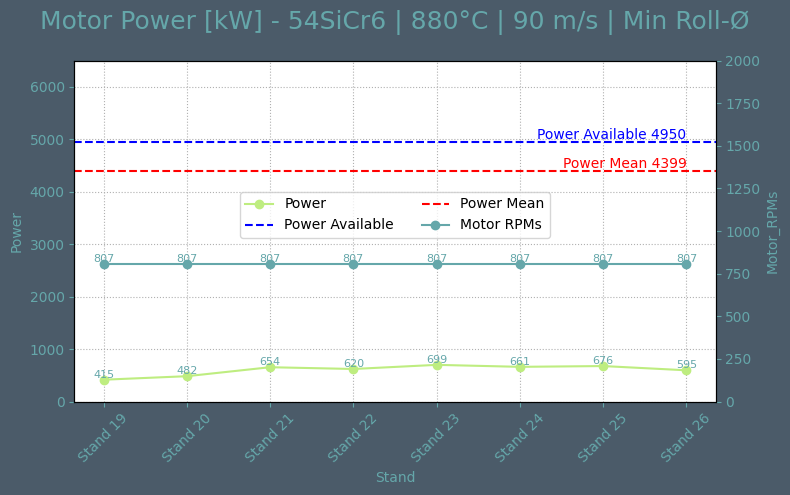

In [82]:
import matplotlib.pyplot as plt

# X-Achse: Stand Labels (letzten 4 Werte nicht berücksichtigen)
x_labels = ['Stand 19', 'Stand 20', 'Stand 21', 'Stand 22', 'Stand 23', 'Stand 24', 'Stand 25', 'Stand 26']
x = range(len(x_labels))

# Y-Daten (letzten 4 Werte nicht berücksichtigen)
power = df['power'][:-4]
#motor_rpms = df['motor_rpms'][:-4]
Motor_RPMs = [ 807, 807, 807, 807, 807, 807, 807, 807]

fig, ax1 = plt.subplots(figsize=(8, 5))

# Power auf linker Y-Achse
ax1.plot(x, power, color='#beed80', marker='o', label='Power')
for i, val in enumerate(power):
    ax1.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')

ax1.axhline(4950, color='blue', linestyle='--', label='Power Available')
ax1.text(len(x_labels)-1, 4950, 'Power Available 4950', color='blue', va='bottom', ha='right', fontsize=10)
ax1.axhline(4399, color='red', linestyle='--', label='Power Mean')
ax1.text(len(x_labels)-1, 4399, 'Power Mean 4399', color='red', va='bottom', ha='right', fontsize=10)

ax1.set_xlabel('Stand')
ax1.set_ylabel('Power')
ax1.set_ylim(0, 6500)
ax1.set_xticks(x)
ax1.set_xticklabels(x_labels, rotation=45)

# Motor RPMs auf rechter Y-Achse
ax2 = ax1.twinx()
ax2.plot(x, Motor_RPMs, color='#65a7aa', marker='o', label='Motor RPMs')
for i, val in enumerate(Motor_RPMs):
  ax2.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')
ax2.set_ylabel('Motor_RPMs')
ax2.set_ylim(0, 2000)

fig.suptitle('Motor Power [kW] - 54SiCr6 | 880°C | 90 m/s | Min Roll-Ø', color='#65a7aa', fontsize=18)
ax1.grid(True, linestyle=':')

# Legende zentriert in der Mitte
lines_labels = [*ax1.get_legend_handles_labels(), *ax2.get_legend_handles_labels()]
lines, labels = lines_labels[0] + lines_labels[2], lines_labels[1] + lines_labels[3]
fig.legend(lines, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.63))

fig.tight_layout()
plt.show()

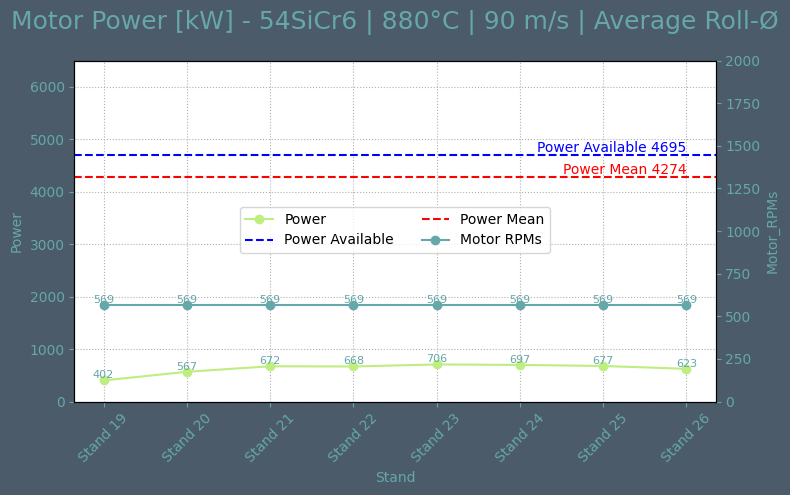

In [ ]:
import matplotlib.pyplot as plt

# X-Achse: Stand Labels (letzten 4 Werte nicht berücksichtigen)
x_labels = ['Stand 19', 'Stand 20', 'Stand 21', 'Stand 22', 'Stand 23', 'Stand 24', 'Stand 25', 'Stand 26']
x = range(len(x_labels))

# Y-Daten (letzten 4 Werte nicht berücksichtigen)
power = df['power'][:-4]
#motor_rpms = df['motor_rpms'][:-4]
Motor_RPMs = [ 569, 569, 569, 569, 569, 569, 569, 569]

fig, ax1 = plt.subplots(figsize=(8, 5))

# Power auf linker Y-Achse
ax1.plot(x, power, color='#beed80', marker='o', label='Power')
for i, val in enumerate(power):
    ax1.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')

ax1.axhline(4695, color='blue', linestyle='--', label='Power Available')
ax1.text(len(x_labels)-1, 4695, 'Power Available 4695', color='blue', va='bottom', ha='right', fontsize=10)
ax1.axhline(4274, color='red', linestyle='--', label='Power Mean')
ax1.text(len(x_labels)-1, 4274, 'Power Mean 4274', color='red', va='bottom', ha='right', fontsize=10)

ax1.set_xlabel('Stand')
ax1.set_ylabel('Power')
ax1.set_ylim(0, 6500)
ax1.set_xticks(x)
ax1.set_xticklabels(x_labels, rotation=45)

# Motor RPMs auf rechter Y-Achse
ax2 = ax1.twinx()
ax2.plot(x, Motor_RPMs, color='#65a7aa', marker='o', label='Motor RPMs')
for i, val in enumerate(Motor_RPMs):
  ax2.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')
ax2.set_ylabel('Motor_RPMs')
ax2.set_ylim(0, 2000)

fig.suptitle('Motor Power [kW] - 54SiCr6 | 880°C | 90 m/s | Average Roll-Ø', color='#65a7aa', fontsize=18)
ax1.grid(True, linestyle=':')

# Legende zentriert in der Mitte
lines_labels = [*ax1.get_legend_handles_labels(), *ax2.get_legend_handles_labels()]
lines, labels = lines_labels[0] + lines_labels[2], lines_labels[1] + lines_labels[3]
fig.legend(lines, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.6))

fig.tight_layout()
plt.show()

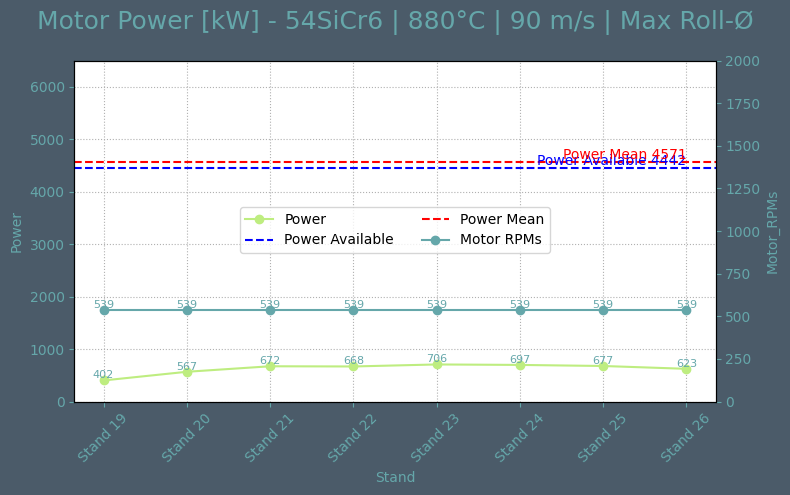

In [ ]:
import matplotlib.pyplot as plt

# X-Achse: Stand Labels (letzten 4 Werte nicht berücksichtigen)
x_labels = ['Stand 19', 'Stand 20', 'Stand 21', 'Stand 22', 'Stand 23', 'Stand 24', 'Stand 25', 'Stand 26']
x = range(len(x_labels))

# Y-Daten (letzten 4 Werte nicht berücksichtigen)
power = df['power'][:-4]
#motor_rpms = df['motor_rpms'][:-4]
Motor_RPMs = [ 539, 539, 539, 539, 539, 539, 539, 539]

fig, ax1 = plt.subplots(figsize=(8, 5))

# Power auf linker Y-Achse
ax1.plot(x, power, color='#beed80', marker='o', label='Power')
for i, val in enumerate(power):
    ax1.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')
ax1.axhline(4442, color='blue', linestyle='--', label='Power Available')
ax1.text(len(x_labels)-1, 4442, 'Power Available 4442', color='blue', va='bottom', ha='right', fontsize=10)
ax1.axhline(4571, color='red', linestyle='--', label='Power Mean')
ax1.text(len(x_labels)-1, 4571, 'Power Mean 4571', color='red', va='bottom', ha='right', fontsize=10)

ax1.set_xlabel('Stand')
ax1.set_ylabel('Power')
ax1.set_ylim(0, 6500)
ax1.set_xticks(x)
ax1.set_xticklabels(x_labels, rotation=45)

# Motor RPMs auf rechter Y-Achse
ax2 = ax1.twinx()
ax2.plot(x, Motor_RPMs, color='#65a7aa', marker='o', label='Motor RPMs')
for i, val in enumerate(Motor_RPMs):
  ax2.text(i, val, f"{int(val)}", color='#65a7aa', fontsize=8, ha='center', va='bottom')
ax2.set_ylabel('Motor_RPMs')
ax2.set_ylim(0, 2000)

fig.suptitle('Motor Power [kW] - 54SiCr6 | 880°C | 90 m/s | Max Roll-Ø', color='#65a7aa', fontsize=18)
ax1.grid(True, linestyle=':')

# Legende zentriert in der Mitte
lines_labels = [*ax1.get_legend_handles_labels(), *ax2.get_legend_handles_labels()]
lines, labels = lines_labels[0] + lines_labels[2], lines_labels[1] + lines_labels[3]
fig.legend(lines, labels, loc='upper center', ncol=2, bbox_to_anchor=(0.5, 0.6))

fig.tight_layout()
plt.show()